# **Geo Foundation Models for Evapotranspiration and GPP: From Tower Pixels to Maps with AlphaEarth Embeddings**

Use a pretrained Earth-observation foundation model as the "what is this land surface?" input to a flux model, test it against hundreds of flux towers it has never seen, and turn it into monthly evapotranspiration (ET) and gross primary productivity (GPP) maps at 100 m.

## **Learning objectives**

By the end of this tutorial you will be able to:

- Explain what a geo foundation model is, what an *embedding* is, and why 64 numbers per pixel can stand in for a year of multi-sensor satellite observations.
- Assemble a multi-site training set (towers x months) that joins tower fluxes, gridded meteorology, vegetation indices, and embeddings.
- Compare the traditional data-driven approach (meteorology + NDVI + land cover) with an embedding-based approach using leave-site-out cross-validation, and see *where* the embedding helps: by biome, when labels are scarce, and for sites the model has never seen.
- Use embedding similarity as a physical tool: find analog sites, map "how Vaira-like" a landscape is, and detect year-to-year surface change.
- Produce wall-to-wall monthly ET and GPP maps around Vaira Ranch, compare them with OpenET, MOD16, and MOD17, and judge them against the tower.
- State the limits of the approach: annual embeddings, black-box axes, extrapolation, and energy-balance closure.

**Before you start:** Notebooks 01 (energy balance and closure), 02 (PET methods), 08 (random forest done carefully), 11 (satellite data). Packages: `scikit-learn`, `rasterio`. On Colab run `!pip install rasterio` first. The full notebook takes about 10-15 minutes to run; the cross-validation cells are the slow ones.

## **Three generations of ET mapping**

Every ET or GPP map is built from the same ingredients: something that describes the **surface** (how much vegetation, what kind, how wet) and something that describes the **atmospheric demand** (radiation, temperature, humidity, wind). The generations differ in how the surface is described.

1. **Process models with remote-sensing inputs.** MOD16 (Mu et al., 2011) runs Penman-Monteith with a surface conductance built from MODIS LAI and land cover. OpenET (Melton et al., 2022) runs an ensemble of six such models at Landsat resolution. The surface enters through a few hand-chosen variables (LAI, NDVI, albedo, land-surface temperature) and biome-specific parameter tables.
2. **Machine-learning upscaling with hand-crafted features.** FLUXCOM (Jung et al., 2019; Tramontana et al., 2016) trains regressors on flux towers using meteorology plus a handful of vegetation indices. This is what you did in Notebook 08, for one site. The surface still enters as NDVI, EVI, LAI: indices that a person designed decades ago to capture greenness.
3. **Machine learning with learned representations.** A *geo foundation model* is a large neural network pretrained on enormous volumes of unlabeled satellite data. It learns, without any flux labels, to compress everything the sensors saw over a year into a short vector, the **embedding**. Our flux model then reads the surface from the embedding instead of from NDVI.

The question for this tutorial is whether generation 3 is actually better, and if so, in what sense: more accurate, more transferable to unseen sites, more label-efficient, or just different.

### **What AlphaEarth gives us**

Google DeepMind's AlphaEarth Foundations (Brown et al., 2025) produces, for every 10 m x 10 m pixel on Earth and every year 2017-2024, a **64-dimensional unit vector** $\mathbf{e} \in \mathbb{R}^{64}$, $\|\mathbf{e}\| = 1$. The model ingested optical (Sentinel-2, Landsat), radar (Sentinel-1), thermal, lidar-derived height, climate, and terrain data, and was trained to summarize the *trajectory* of the surface through the year. Three properties matter for us:

- **Similarity is a dot product.** For two pixels or two years, $\mathbf{e}_1 \cdot \mathbf{e}_2 = \cos\theta$ is close to 1 for surfaces that look alike and drops toward 0 (or below) when they differ. This makes change detection and analog search one line of code.
- **Embeddings are linearly composable.** Averaging the vectors of the 10 m pixels inside a flux footprint gives a meaningful footprint embedding, and averaging to 100 m preserves the semantics. The length of the average tells you how heterogeneous the footprint is (identical vectors average to length 1; mixed vectors average to something shorter).
- **The axes mean nothing individually.** Unlike NDVI, no single component is "greenness". Only the whole vector carries information, which is why we feed all 64 to the model and interpret it through similarity, projections, and grouped importance rather than one axis at a time.

Think of word embeddings: the numbers in "river" are not readable, but "river" is close to "stream" and far from "parking lot". AlphaEarth does that for landscapes.

The embeddings are annual. That is the design constraint of this tutorial: the embedding tells the model **what** the surface is, meteorology tells it **when**, and the two together give monthly fluxes.

## **Setup: packages and data**

The cell below loads the packages we need and defines a small helper that finds the sample data. If you are running inside the cloned repository it uses the local `sample_data/` folder; on Google Colab it downloads the files from GitHub.

All data were prepared once with Google Earth Engine by `sample_data/alphaearth/prep_alphaearth_data.py`, so **no Earth Engine account is needed** to run this notebook. The last section shows the Earth Engine calls for those who want to reproduce or extend the extraction.

| File | Content |
|---|---|
| `alphaearth/sites.csv` | 289 AmeriFlux towers (US, Canada, Mexico) with data in 2017-2024: coordinates, IGBP class reported by the site, Koppen climate, elevation, MODIS land cover |
| `alphaearth/site_year_embeddings.csv` | 64-D AlphaEarth embedding averaged over a 100 m footprint around each tower, per year |
| `alphaearth/site_month_data.csv` | monthly tower ET and GPP (FLUXNET/ONEFlux processing), Daymet meteorology, Landsat 8/9 NDVI (30 m, 100 m footprint), MODIS NDVI/EVI/LAI/fPAR (500 m) |
| `alphaearth/region/*.tif` | 40 km x 40 km grid around Vaira Ranch (UTM 10N): embeddings for 2021 and 2023 at 100 m, monthly Daymet (1 km), Landsat NDVI (100 m), MODIS vegetation, MOD16 ET, MOD17 GPP, OpenET ensemble ET (100 m), land cover, elevation, year-to-year embedding similarity |

In [1]:
import os, urllib.request, warnings, time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import rasterio
from rasterio.warp import reproject, Resampling
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import RidgeCV
from sklearn.decomposition import PCA
from sklearn.model_selection import GroupKFold, GroupShuffleSplit
from sklearn.metrics import r2_score, mean_squared_error
warnings.filterwarnings('ignore')
plt.rcParams['font.family'] = 'serif'
plt.rcParams['figure.dpi'] = 100

BASE = "https://raw.githubusercontent.com/praghav444/CEE491-591-Process-Hydrology-Tutorials/main/sample_data/"

def get_data(fname):
    """Return a local path to a sample data file (may include a sub-folder), downloading it from GitHub if needed."""
    for local in [os.path.join('..', '..', 'sample_data', fname), os.path.join('sample_data', fname)]:
        if os.path.exists(local):
            return local
    out = os.path.join('sample_data', fname)
    os.makedirs(os.path.dirname(out), exist_ok=True)
    urllib.request.urlretrieve(BASE + fname.replace(os.sep, '/'), out)
    return out

files = ['alphaearth/sites.csv', 'alphaearth/site_year_embeddings.csv', 'alphaearth/site_month_data.csv']
paths = {f: get_data(f) for f in files}

sites = pd.read_csv(paths['alphaearth/sites.csv']).set_index('site_id')
emb = pd.read_csv(paths['alphaearth/site_year_embeddings.csv'])
mon = pd.read_csv(paths['alphaearth/site_month_data.csv'])
EMB = [f'A{i:02d}' for i in range(64)]
print(f'{len(sites)} sites, {len(emb)} site-years of embeddings, {len(mon)} site-months')
sites.head()

289 sites, 2312 site-years of embeddings, 27744 site-months


,lat,lon,igbp,koppen,elev_gtopo30,zip_start,zip_end,zip,elev_m,lc_modis
site_id,,,,,,,,,,
CA-ARB,52.6950,-83.9452,WET,Dfc,106.0,2011,2024,AMF_CA-ARB_FLUXNET_2011-2024_v1.3_r1.zip,91.549525,11
CA-ARF,52.7008,-83.9550,WET,Dfc,100.0,2011,2024,AMF_CA-ARF_FLUXNET_2011-2024_v1.3_r1.zip,90.497662,9
CA-BOU,50.5244,-63.2064,WET,Dfc,152.0,2018,2020,AMF_CA-BOU_FLUXNET_2018-2020_v1.3_r1.zip,110.207218,8
CA-CF3,58.6658,-93.8304,WET,Dfc,20.0,2022,2025,AMF_CA-CF3_FLUXNET_2022-2025_v1.3_r1.zip,22.836276,7
CA-Ca3,49.5350,-124.9000,ENF,Csb,126.0,2001,2024,AMF_CA-Ca3_FLUXNET_2001-2024_v1.3_r1.zip,166.219252,1


## **Step 1: What is inside an embedding?**

Before modeling anything, let us look at the embeddings themselves. Each tower has one 64-vector per year (the mean of the roughly 300 pixels of 10 m inside a 100 m radius).

Vector length (footprint mean): median 0.987, min 0.880, max 0.999


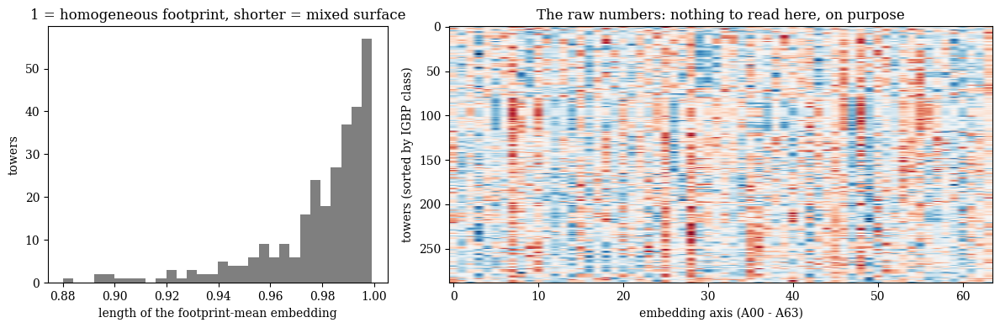

In [2]:
e21 = emb[emb.year == 2021].set_index('site_id')
norm = np.linalg.norm(e21[EMB].values, axis=1)
print(f'Vector length (footprint mean): median {np.median(norm):.3f}, min {norm.min():.3f}, max {norm.max():.3f}')

fig, axs = plt.subplots(1, 2, figsize=(12, 4), gridspec_kw={'width_ratios': [1, 1.6]})
axs[0].hist(norm, bins=30, color='tab:gray')
axs[0].set_xlabel('length of the footprint-mean embedding'); axs[0].set_ylabel('towers')
axs[0].set_title('1 = homogeneous footprint, shorter = mixed surface')
axs[1].imshow(e21[EMB].values[np.argsort(sites.loc[e21.index, 'igbp'].values)], aspect='auto', cmap='RdBu_r', vmin=-0.4, vmax=0.4)
axs[1].set_xlabel('embedding axis (A00 - A63)'); axs[1].set_ylabel('towers (sorted by IGBP class)')
axs[1].set_title('The raw numbers: nothing to read here, on purpose'); plt.tight_layout()

The heatmap is the honest view: 64 columns of numbers with no obvious meaning. Notice the horizontal banding, though. Towers are sorted by land-cover class, and rows within a class resemble each other. The structure is in the *geometry* of the vectors, not in any single axis. Two ways to see it:

- **Project to 2-D with PCA** and color by the land-cover class reported by each site. If the embedding encodes ecosystem type, classes should separate without ever having been told what a forest is.
- **Similarity to one site.** The dot product with the Vaira Ranch embedding ranks every other tower by how much its surface resembles an annual grassland in a Mediterranean climate.

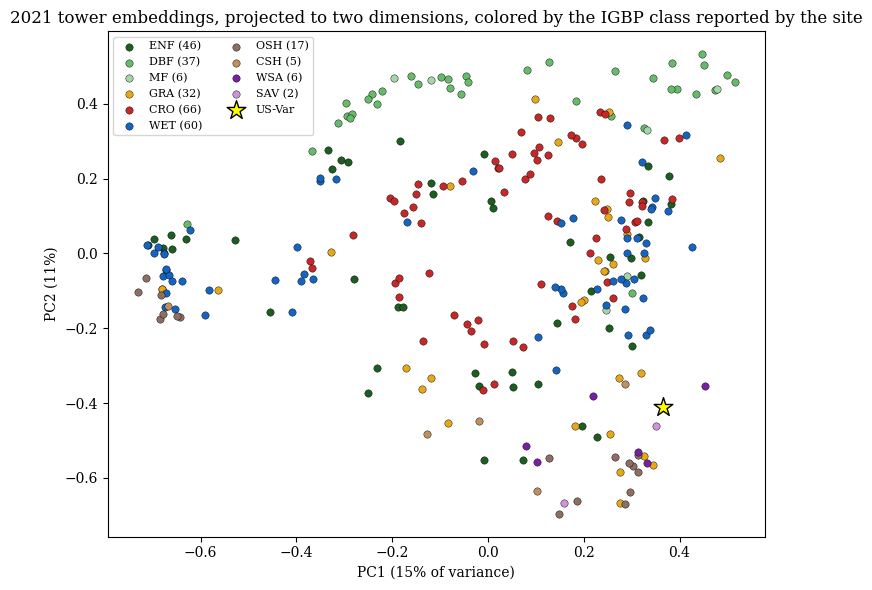

In [3]:
igbp = sites.loc[e21.index, 'igbp']
main_classes = ['ENF', 'DBF', 'MF', 'GRA', 'CRO', 'WET', 'OSH', 'CSH', 'WSA', 'SAV']
class_colors = dict(zip(main_classes, ['#1b5e20', '#66bb6a', '#a5d6a7', '#e6a817', '#c62828', '#1565c0', '#8d6e63', '#bf8f5f', '#7b1fa2', '#ce93d8']))

pca = PCA(n_components=2).fit(e21[EMB])
xy = pca.transform(e21[EMB])
fig, ax = plt.subplots(figsize=(7.5, 6))
for c in main_classes:
    sel = (igbp == c).values
    if sel.sum():
        ax.scatter(xy[sel, 0], xy[sel, 1], s=28, color=class_colors[c], label=f'{c} ({sel.sum()})', edgecolor='k', linewidth=0.3)
ax.scatter(*xy[e21.index.get_loc('US-Var')], s=200, marker='*', color='yellow', edgecolor='k', zorder=5, label='US-Var')
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.0f}% of variance)'); ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.0f}%)')
ax.set_title('2021 tower embeddings, projected to two dimensions, colored by the IGBP class reported by the site')
ax.legend(fontsize=8, ncol=2); plt.tight_layout()

Towers most similar to US-Var (Vaira Ranch, annual grassland, Csa):


,similarity,igbp,koppen,lat,lon
site_id,,,,,
US-Var,1.000,GRA,Csa,38.41,-120.95
US-Ton,0.854,WSA,Csa,38.43,-120.97
US-xSJ,0.815,SAV,Csa,37.11,-119.73
US-CGG,0.777,GRA,Csb,37.94,-121.98
US-xSP,0.662,ENF,Csa,37.03,-119.26
US-Hn2,0.562,GRA,BWk,46.69,-119.46
US-Hn3,0.558,OSH,BWk,46.69,-119.46
US-Srr,0.552,WET,Csb,38.20,-122.03
US-EKN,0.474,WET,Csb,36.84,-121.73



Least similar:


,similarity,igbp,koppen,lat,lon
site_id,,,,,
US-CS2,-0.156,ENF,Dfb,44.15,-89.50
US-UC1,-0.157,CVM,Cfa,40.75,-78.01
US-PFb,-0.169,ENF,Dfb,45.97,-90.32
US-CS5,-0.273,CRO,Dfb,44.11,-89.54
US-CS1,-0.286,CRO,Dfb,44.10,-89.54


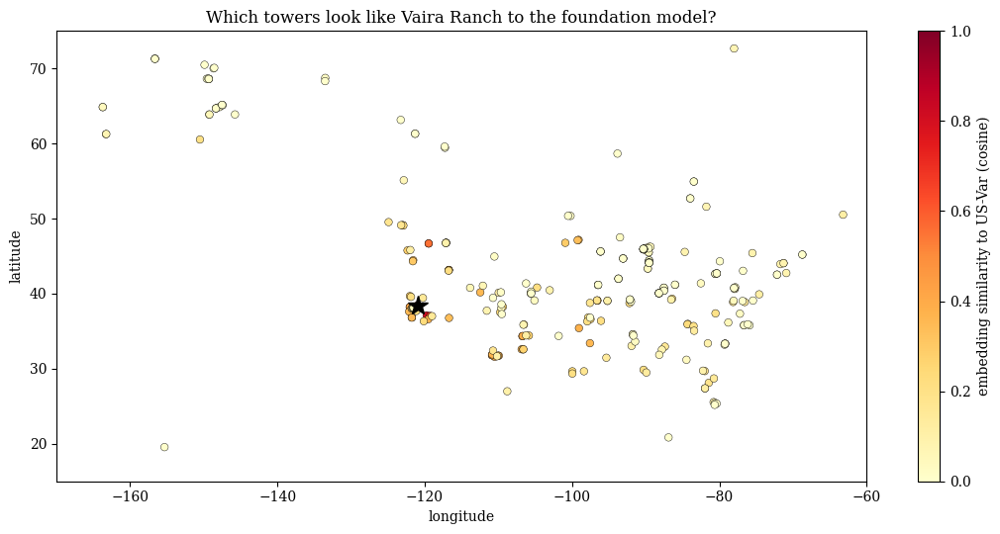

In [4]:
e21n = e21[EMB].div(np.linalg.norm(e21[EMB].values, axis=1), axis=0)   # re-normalise the footprint means to unit length
sim_var = e21n @ e21n.loc['US-Var']                    # cosine similarity
sim_var = sim_var.sort_values(ascending=False)
tab = pd.DataFrame({'similarity': sim_var.round(3), 'igbp': sites.loc[sim_var.index, 'igbp'],
                    'koppen': sites.loc[sim_var.index, 'koppen'], 'lat': sites.loc[sim_var.index, 'lat'].round(2),
                    'lon': sites.loc[sim_var.index, 'lon'].round(2)})
print('Towers most similar to US-Var (Vaira Ranch, annual grassland, Csa):')
display(tab.head(10))
print('\nLeast similar:')
display(tab.tail(5))

fig, ax = plt.subplots(figsize=(11, 5.5))
sc = ax.scatter(sites.loc[sim_var.index, 'lon'], sites.loc[sim_var.index, 'lat'], c=sim_var.values, cmap='YlOrRd', s=30, edgecolor='k', linewidth=0.3, vmin=0, vmax=1)
ax.plot(*sites.loc['US-Var', ['lon', 'lat']], 'k*', ms=15)
ax.set_xlim(-170, -60); ax.set_ylim(15, 75); ax.set_xlabel('longitude'); ax.set_ylabel('latitude')
plt.colorbar(sc, label='embedding similarity to US-Var (cosine)'); ax.set_title('Which towers look like Vaira Ranch to the foundation model?'); plt.tight_layout()

The nearest neighbors of Vaira Ranch are other grasslands and savannas in dry-summer climates, most of them in California, and the least similar are wetlands, snow, and boreal forest. Nobody told the model about Koppen classes or IGBP labels. That is the promise of a foundation model: the expensive, general part of "understanding the surface" is already done, and we only have to learn the cheap, specific part, how that surface turns weather into ET.

One more diagnostic before modeling: how stable is a site's embedding from year to year? A pixel that looks the same every year has a year-to-year similarity near 1. Croplands rotate, burn, and get replanted, so we expect them to move.

igbp
CRO    0.753
CVM    0.857
SAV    0.896
GRA    0.904
WSA    0.914
CSH    0.918
MF     0.925
WET    0.929
DBF    0.935
ENF    0.938
OSH    0.954
BSV    0.960
EBF    0.964
SNO    0.988


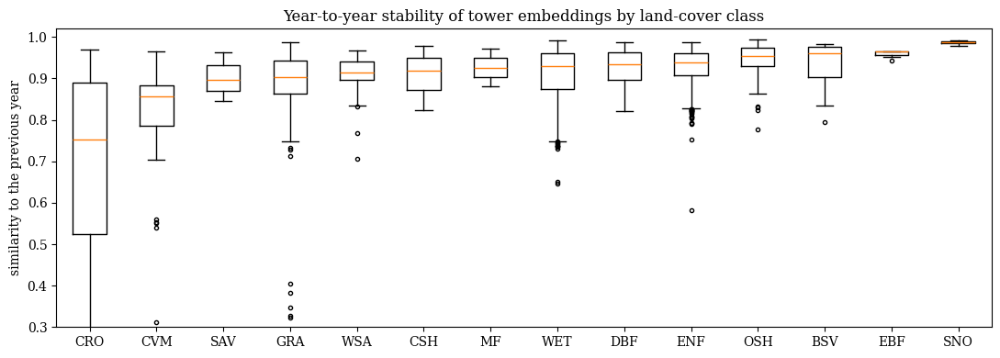

In [5]:
piv = emb.set_index(['site_id', 'year'])[EMB]
rows = []
for s in emb.site_id.unique():
    ys = sorted(piv.loc[s].index)
    for y0, y1 in zip(ys[:-1], ys[1:]):
        if y1 == y0 + 1:
            rows.append((s, y1, float(piv.loc[(s, y0)] @ piv.loc[(s, y1)])))
yy = pd.DataFrame(rows, columns=['site_id', 'year', 'sim_prev_year'])
yy['igbp'] = sites.loc[yy.site_id, 'igbp'].values
order = yy.groupby('igbp').sim_prev_year.median().sort_values().index
fig, ax = plt.subplots(figsize=(11, 4))
ax.boxplot([yy[yy.igbp == c].sim_prev_year for c in order], showfliers=True, flierprops=dict(ms=3)); ax.set_xticks(range(1, len(order) + 1)); ax.set_xticklabels(order)
ax.set_ylabel('similarity to the previous year'); ax.set_title('Year-to-year stability of tower embeddings by land-cover class'); ax.set_ylim(0.3, 1.02)
plt.tight_layout()
print(yy.groupby('igbp').sim_prev_year.median().sort_values().round(3).to_string())

## **Step 2: Assemble the training table**

One row per tower per month. The **targets** come from the towers; the **predictors** come from gridded products so that exactly the same predictors exist for every pixel of a map later.

**Targets.** Monthly mean ET (mm/day) from energy-balance-corrected latent heat (`LE_CORR`, Notebook 01 explains why the correction is needed; OpenET and FLUXCOM are both trained against corrected fluxes) and monthly mean GPP (gC m$^{-2}$ d$^{-1}$) from nighttime partitioning. Months are kept when at least 70% of the half-hours were measured or well gap-filled.

**Meteorology (Daymet V4, 1 km).** Monthly means of maximum and minimum temperature, shortwave radiation, vapor pressure, day length, and precipitation. From these we derive the quantities a hydrologist expects: mean temperature, vapor pressure deficit, daily radiation in MJ m$^{-2}$ d$^{-1}$, Hargreaves reference ET (Notebook 02), and three-month antecedent precipitation as a crude soil-water memory.

**Vegetation indices (the traditional surface description).** Landsat 8/9 monthly median NDVI at 30 m averaged over the 100 m footprint, gap-filled across cloudy months, plus MODIS NDVI, EVI, LAI, and fPAR at 500 m. Plus the 500 m MODIS land-cover class (one-hot) and elevation.

**Embedding (the foundation-model surface description).** The 64 components for the tower's footprint in that year.

In [6]:
def esat(T):                      # saturation vapor pressure, kPa, T in C
    return 0.6108 * np.exp(17.27 * T / (T + 237.3))

def extraterrestrial_radiation(lat_deg, doy):
    """FAO-56 eq. 21: daily extraterrestrial radiation, MJ m-2 d-1."""
    phi = np.radians(lat_deg)
    dr = 1 + 0.033 * np.cos(2 * np.pi * doy / 365)
    dec = 0.409 * np.sin(2 * np.pi * doy / 365 - 1.39)
    ws = np.arccos(np.clip(-np.tan(phi) * np.tan(dec), -1, 1))
    return 24 * 60 / np.pi * 0.0820 * dr * (ws * np.sin(phi) * np.sin(dec) + np.cos(phi) * np.cos(dec) * np.sin(ws))

def add_met_features(df, lat):
    """Derived meteorological features from monthly Daymet columns. `lat` is a Series/array aligned with df."""
    df['tmean'] = (df.tmax + df.tmin) / 2
    df['vpd'] = np.clip((esat(df.tmax) + esat(df.tmin)) / 2 - df.vp / 1000, 0, None)      # kPa
    df['rs'] = df.srad * df.dayl / 1e6                                                       # MJ m-2 d-1
    df['dayl_h'] = df.dayl / 3600
    doy = 15 + 30.4 * (df.month - 1)
    ra = extraterrestrial_radiation(lat, doy)
    df['et0_hg'] = 0.0023 * (df.tmean + 17.8) * np.sqrt(np.clip(df.tmax - df.tmin, 0, None)) * ra / 2.45   # Hargreaves, mm/day
    df['month_sin'] = np.sin(2 * np.pi * df.month / 12); df['month_cos'] = np.cos(2 * np.pi * df.month / 12)
    return df

mon = mon.sort_values(['site_id', 'year', 'month']).reset_index(drop=True)
mon = add_met_features(mon, sites.loc[mon.site_id, 'lat'].values)
mon['prcp_3m'] = mon.groupby('site_id').prcp.transform(lambda s: s.rolling(3, min_periods=1).mean())

# Landsat NDVI: fill cloudy months with the average of the previous and next valid month, then with MODIS NDVI
g = mon.groupby('site_id').ndvi_landsat
mon['ndvi'] = ((g.ffill() + g.bfill()) / 2).fillna(g.ffill()).fillna(g.bfill()).fillna(mon.ndvi_modis)
mon['ndvi_gapfilled'] = mon.ndvi_landsat.isna()

# targets with quality control
mon['ET'] = np.where(mon.LE_F_MDS_QC >= 0.7, mon.ET_obs_corr, np.nan)
mon['GPP'] = np.where(mon.NEE_VUT_REF_QC >= 0.7, np.clip(mon.GPP_obs, 0, None), np.nan)

# static features and embeddings
mon['elev_m'] = sites.loc[mon.site_id, 'elev_m'].values
mon['lc_modis'] = sites.loc[mon.site_id, 'lc_modis'].values
LC_CLASSES = list(range(1, 18))
for c in LC_CLASSES:
    mon[f'lc_{c}'] = (mon.lc_modis == c).astype(float)
mon = mon.merge(emb, on=['site_id', 'year'], how='left')
mon['igbp'] = sites.loc[mon.site_id, 'igbp'].values

# annual summaries of the vegetation indices: a "static" traditional surface description, the fair counterpart of an annual embedding
ann_veg = mon.groupby(['site_id', 'year']).agg(ndvi_mean=('ndvi', 'mean'), ndvi_max=('ndvi', 'max'), ndvi_min=('ndvi', 'min'),
                                                lai_mean=('lai_modis', 'mean'), lai_max=('lai_modis', 'max')).reset_index()
mon = mon.merge(ann_veg, on=['site_id', 'year'], how='left')

MET = ['tmean', 'tmax', 'tmin', 'vpd', 'rs', 'dayl_h', 'prcp', 'prcp_3m', 'et0_hg', 'month_sin', 'month_cos']
VEG = ['ndvi', 'ndvi_modis', 'evi_modis', 'lai_modis', 'fpar_modis']                # monthly
ANNUAL_VEG = ['ndvi_mean', 'ndvi_max', 'ndvi_min', 'lai_mean', 'lai_max']           # annual
STATIC = ['elev_m'] + [f'lc_{c}' for c in LC_CLASSES]
FEAT = {'M: met only': MET,
        'A0: met + annual NDVI/LAI + land cover': MET + ANNUAL_VEG + STATIC,
        'B: met + embedding': MET + EMB,
        'A: met + monthly NDVI/LAI + land cover': MET + VEG + ANNUAL_VEG + STATIC,
        'B+: met + monthly NDVI/LAI + embedding': MET + VEG + EMB}
ALL_PRED = sorted(set(MET + VEG + ANNUAL_VEG + STATIC + EMB))

data = {t: mon.dropna(subset=ALL_PRED + [t]).copy() for t in ['ET', 'GPP']}
for t, d in data.items():
    print(f'{t}: {len(d)} site-months from {d.site_id.nunique()} sites, {d.year.min()}-{d.year.max()}; '
          f'{d.ndvi_gapfilled.mean()*100:.0f}% of Landsat NDVI values gap-filled')

ET: 9274 site-months from 203 sites, 2017-2024; 16% of Landsat NDVI values gap-filled
GPP: 10491 site-months from 239 sites, 2017-2024; 15% of Landsat NDVI values gap-filled


,sites,months
igbp,,
ENF,35,1820
CRO,45,1581
DBF,31,1431
GRA,28,1390
WET,25,1068
OSH,14,755
CSH,5,322
MF,5,242
CVM,5,216


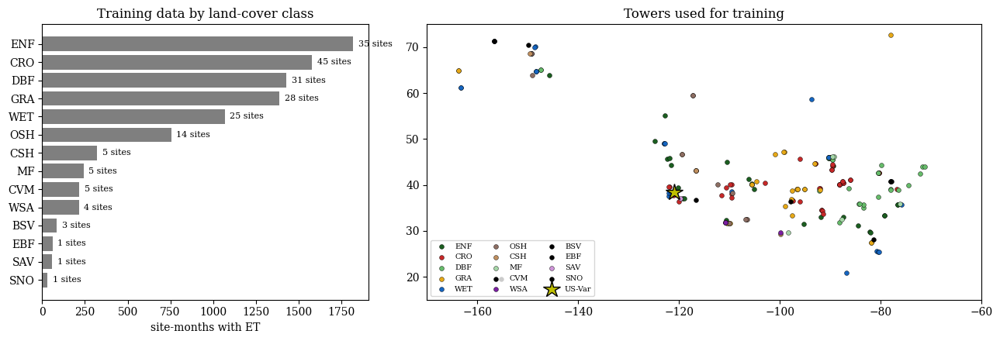

In [7]:
d = data['ET']
cnt = d.groupby('igbp').agg(sites=('site_id', 'nunique'), months=('ET', 'size')).sort_values('months', ascending=False)
fig, axs = plt.subplots(1, 2, figsize=(13, 4.5), gridspec_kw={'width_ratios': [1, 1.7]})
axs[0].barh(cnt.index[::-1], cnt.months[::-1], color='tab:gray')
for i, (c, r) in enumerate(cnt[::-1].iterrows()):
    axs[0].text(r.months + 30, i, f'{r.sites} sites', va='center', fontsize=8)
axs[0].set_xlabel('site-months with ET'); axs[0].set_title('Training data by land-cover class')
for c in cnt.index:
    s = d[d.igbp == c].site_id.unique()
    axs[1].scatter(sites.loc[s, 'lon'], sites.loc[s, 'lat'], s=18, color=class_colors.get(c, 'k'), label=c, edgecolor='k', linewidth=0.3)
axs[1].plot(*sites.loc['US-Var', ['lon', 'lat']], 'y*', ms=16, mec='k', label='US-Var')
axs[1].set_xlim(-170, -60); axs[1].set_ylim(15, 75); axs[1].legend(fontsize=7, ncol=3, loc='lower left'); axs[1].set_title('Towers used for training')
plt.tight_layout()
display(cnt)

## **Step 3: Evaluate the right way, then train the traditional models**

The mistake to avoid is the one from Notebook 08 in a spatial disguise: if the same tower appears in both training and test data, the model can memorize the site and the score says nothing about mapping *new* places. We therefore use **leave-site-out cross-validation** (`GroupKFold` with the tower as the group, five folds): every tower is predicted by a model that never saw any of its months. The metrics are R$^2$ (identical to Nash-Sutcliffe efficiency for out-of-sample predictions), RMSE, and mean bias.

The models are named by what they know about the surface. All random forests use the settings of Notebook 08.

| Model | Surface description | Temporal resolution of the surface description |
|---|---|---|
| Classical | NDVI (crop coefficient / light-use efficiency) | monthly |
| M | nothing: meteorology only | - |
| A0 | annual NDVI and LAI statistics, MODIS land cover, elevation | annual |
| A | monthly NDVI, EVI, LAI, fPAR plus everything in A0 | monthly |
| B | AlphaEarth embedding | annual |
| B+ | AlphaEarth embedding plus monthly NDVI, EVI, LAI, fPAR | monthly |

The pairs to compare are **A0 versus B** (a traditional annual surface description against a learned annual one, same information budget) and **A versus B+** (does the embedding add anything once monthly phenology is available?). Model M is the floor: how much does *any* surface information add to weather alone?

**Classical, almost no training (generation 1 in miniature).** ET as a crop coefficient times reference ET, with the coefficient a linear function of NDVI, $ET = (a\,NDVI + b)\,ET_0$; this is the idea behind SIMS in the OpenET ensemble. GPP as a light-use-efficiency model in the spirit of MOD17: $GPP = \varepsilon \cdot fPAR(NDVI) \cdot PAR \cdot f(T_{min}) \cdot f(VPD)$ with the generic MOD17 temperature and VPD ramps and a single fitted $\varepsilon$. Two fitted numbers for ET, one for GPP.

**Models M, A0 and A: the FLUXCOM-style random forests (generation 2).**

In [8]:
def metrics(obs, sim):
    m = np.isfinite(obs) & np.isfinite(sim)
    obs, sim = obs[m], sim[m]
    return {'R2': r2_score(obs, sim), 'RMSE': np.sqrt(mean_squared_error(obs, sim)), 'bias': np.mean(sim - obs), 'n': len(obs)}

def rf():
    return RandomForestRegressor(n_estimators=200, min_samples_leaf=5, max_features=0.33, n_jobs=-1, random_state=0)

def cv_predict(df, features, target, make_model, n_splits=5):
    """Leave-site-out cross-validated predictions."""
    pred = pd.Series(np.nan, index=df.index)
    for tr, te in GroupKFold(n_splits).split(df, groups=df.site_id):
        m = make_model()
        m.fit(df.iloc[tr][features], df.iloc[tr][target])
        pred.iloc[te] = m.predict(df.iloc[te][features])
    return pred

class ClassicalET:
    """ET = (a NDVI + b) ET0, fitted by least squares."""
    def fit(self, X, y):
        A = np.c_[X.ndvi * X.et0_hg, X.et0_hg]
        self.coef_, *_ = np.linalg.lstsq(A, y, rcond=None); return self
    def predict(self, X):
        return np.clip(np.c_[X.ndvi * X.et0_hg, X.et0_hg] @ self.coef_, 0, None)

class ClassicalGPP:
    """Light-use efficiency: GPP = eps * fPAR(NDVI) * PAR * f(Tmin) * f(VPD), MOD17-style ramps, eps fitted."""
    @staticmethod
    def drivers(X):
        fpar = np.clip(1.24 * X.ndvi - 0.168, 0, 1)                  # Sims et al. (2006)
        par = 0.45 * X.rs                                             # MJ m-2 d-1
        ft = np.clip((X.tmin + 8) / (8.5 + 8), 0, 1)                   # 0 at -8 C, 1 at 8.5 C
        fvpd = np.clip((4.0 - X.vpd) / (4.0 - 0.65), 0, 1)             # 1 below 0.65 kPa, 0 above 4 kPa
        return fpar * par * ft * fvpd
    def fit(self, X, y):
        d = self.drivers(X); self.eps_ = float((d * y).sum() / (d * d).sum()); return self
    def predict(self, X):
        return self.eps_ * self.drivers(X)

results, preds = {}, {}
for t in ['ET', 'GPP']:
    d = data[t]
    classical = ClassicalET if t == 'ET' else ClassicalGPP
    t0 = time.time()
    preds[(t, 'Classical (NDVI x ET0 / LUE)')] = cv_predict(d, MET + VEG, t, classical)
    for k in ['M: met only', 'A0: met + annual NDVI/LAI + land cover', 'A: met + monthly NDVI/LAI + land cover']:
        preds[(t, k)] = cv_predict(d, FEAT[k], t, rf)
    for k in ['Classical (NDVI x ET0 / LUE)', 'M: met only', 'A0: met + annual NDVI/LAI + land cover', 'A: met + monthly NDVI/LAI + land cover']:
        results[(t, k)] = metrics(d[t].values, preds[(t, k)].values)
    print(f'{t}: classical + models M, A0, A done in {time.time()-t0:.0f} s')
pd.DataFrame(results).T.round(3)

ET: classical + models M, A0, A done in 10 s


GPP: classical + models M, A0, A done in 10 s


R2   RMSE   bias        n
ET  Classical (NDVI x ET0 / LUE)            0.703  0.850 -0.070   9274.0
    M: met only                             0.715  0.834 -0.007   9274.0
    A0: met + annual NDVI/LAI + land cover  0.786  0.722 -0.012   9274.0
    A: met + monthly NDVI/LAI + land cover  0.819  0.663 -0.013   9274.0
GPP Classical (NDVI x ET0 / LUE)            0.633  2.489 -0.070  10491.0
    M: met only                             0.682  2.318  0.030  10491.0
    A0: met + annual NDVI/LAI + land cover  0.764  1.994  0.042  10491.0
    A: met + monthly NDVI/LAI + land cover  0.853  1.573  0.028  10491.0

Read the table from top to bottom: each row adds surface information. Meteorology alone (M) already explains a lot, because the seasonal cycle of radiation and temperature is the seasonal cycle of ET. The annual surface description (A0) adds the difference between a forest and a cropland; the monthly indices (A) add phenology. Model A beats the two-parameter classical formula by a wide margin because the forest can use interactions between radiation, VPD, antecedent rain, and greenness that a fixed crop coefficient cannot. These are the numbers the foundation model has to beat.

## **Step 4: The foundation-model approach**

Now replace the hand-crafted surface description with the embedding.

- **Model B: meteorology + embedding.** No NDVI, no LAI, no land-cover table. The model has to read everything about the surface from the 64 numbers.
- **Model B+: meteorology + NDVI/LAI + embedding.** The embedding is annual; monthly NDVI adds within-year phenology (green-up, harvest, senescence) that an annual vector cannot carry. Does the combination help?

Same forest, same leave-site-out folds, same metrics.

ET: models B and B+ done in 17 s


GPP: models B and B+ done in 21 s


R2   RMSE   bias        n
target model                                                               
ET     Classical (NDVI x ET0 / LUE)            0.703  0.850 -0.070   9274.0
       M: met only                             0.715  0.834 -0.007   9274.0
       A0: met + annual NDVI/LAI + land cover  0.786  0.722 -0.012   9274.0
       B: met + embedding                      0.814  0.673 -0.006   9274.0
       A: met + monthly NDVI/LAI + land cover  0.819  0.663 -0.013   9274.0
       B+: met + monthly NDVI/LAI + embedding  0.827  0.649 -0.011   9274.0
GPP    Classical (NDVI x ET0 / LUE)            0.633  2.489 -0.070  10491.0
       M: met only                             0.682  2.318  0.030  10491.0
       A0: met + annual NDVI/LAI + land cover  0.764  1.994  0.042  10491.0
       B: met + embedding                      0.810  1.791  0.038  10491.0
       A: met + monthly NDVI/LAI + land cover  0.853  1.573  0.028  10491.0
       B+: met + monthly NDVI/LAI + embedding  0.870  1.481  0.037  10491.0

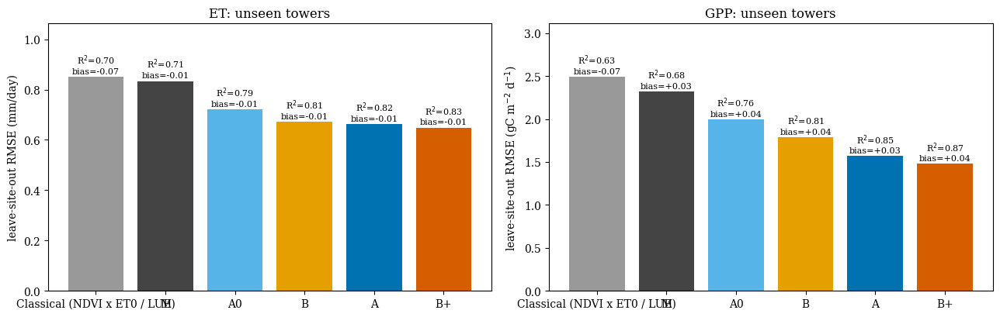

In [9]:
for t in ['ET', 'GPP']:
    d = data[t]
    t0 = time.time()
    for k in ['B: met + embedding', 'B+: met + monthly NDVI/LAI + embedding']:
        preds[(t, k)] = cv_predict(d, FEAT[k], t, rf)
        results[(t, k)] = metrics(d[t].values, preds[(t, k)].values)
    print(f'{t}: models B and B+ done in {time.time()-t0:.0f} s')

MODELS = ['Classical (NDVI x ET0 / LUE)', 'M: met only', 'A0: met + annual NDVI/LAI + land cover', 'B: met + embedding',
          'A: met + monthly NDVI/LAI + land cover', 'B+: met + monthly NDVI/LAI + embedding']
MODEL_COLORS = dict(zip(MODELS, ['#999999', '#444444', '#56B4E9', '#E69F00', '#0072B2', '#D55E00']))
SHORT = {k: k.split(':')[0] for k in MODELS}
res = pd.DataFrame(results).T.round(3).loc[[(t, k) for t in ['ET', 'GPP'] for k in MODELS]]
res.index.names = ['target', 'model']
display(res)

fig, axs = plt.subplots(1, 2, figsize=(13, 4.2))
for ax, t in zip(axs, ['ET', 'GPP']):
    r = res.loc[t].loc[MODELS]
    ax.bar(range(len(MODELS)), r.RMSE, color=[MODEL_COLORS[m] for m in MODELS])
    for i, (m, row) in enumerate(r.iterrows()):
        ax.text(i, row.RMSE * 1.01, f"R$^2$={row.R2:.2f}\nbias={row.bias:+.2f}", ha='center', va='bottom', fontsize=8)
    ax.set_xticks(range(len(MODELS))); ax.set_xticklabels([SHORT[m] for m in MODELS]); ax.set_ylim(0, r.RMSE.max() * 1.25)
    ax.set_ylabel('leave-site-out RMSE ' + ('(mm/day)' if t == 'ET' else '(gC m$^{-2}$ d$^{-1}$)')); ax.set_title(f'{t}: unseen towers')
plt.tight_layout()

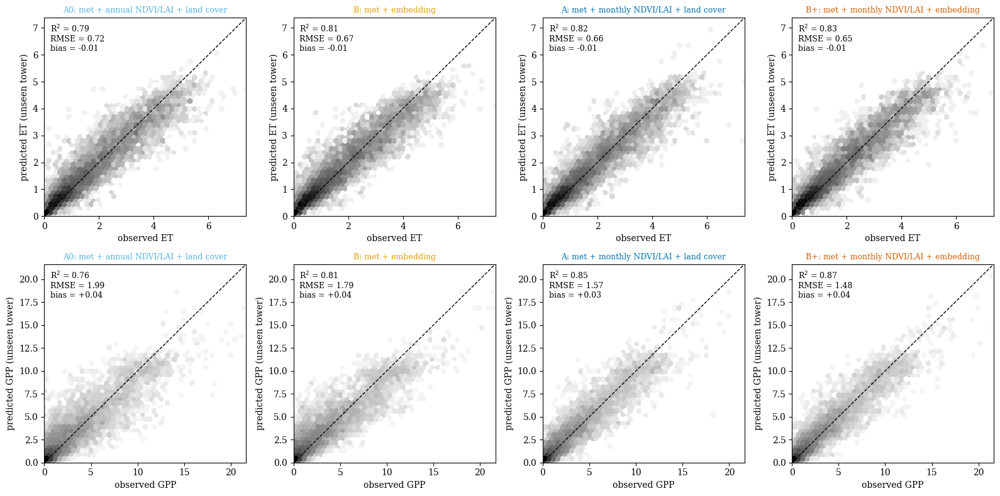

In [10]:
SCATTER = ['A0: met + annual NDVI/LAI + land cover', 'B: met + embedding', 'A: met + monthly NDVI/LAI + land cover', 'B+: met + monthly NDVI/LAI + embedding']
fig, axs = plt.subplots(2, 4, figsize=(16, 8))
for i, t in enumerate(['ET', 'GPP']):
    d = data[t]; lim = [0, np.nanpercentile(d[t], 99.5) * 1.05]
    for j, k in enumerate(SCATTER):
        ax = axs[i, j]; p = preds[(t, k)]
        ax.hexbin(d[t], p, gridsize=45, extent=lim * 2, cmap='Greys', mincnt=1, bins='log')
        ax.plot(lim, lim, 'k--', lw=1); ax.set_xlim(lim); ax.set_ylim(lim)
        r = results[(t, k)]
        ax.text(0.03, 0.97, f"R$^2$ = {r['R2']:.2f}\nRMSE = {r['RMSE']:.2f}\nbias = {r['bias']:+.2f}", transform=ax.transAxes, va='top', fontsize=9)
        ax.set_title(k, fontsize=9, color=MODEL_COLORS[k]); ax.set_xlabel(f'observed {t}'); ax.set_ylabel(f'predicted {t} (unseen tower)')
plt.tight_layout()

Three things to take from the table.

1. **Annual versus annual (A0 versus B).** With the same information budget, one vector per site-year, the learned description beats the hand-crafted one for both fluxes. The 64 numbers carry more about how a surface uses water and light than annual NDVI and LAI statistics, the MODIS land-cover class, and elevation together.
2. **Phenology matters (A versus A0, B+ versus B).** Adding monthly indices improves every model, and more for GPP than for ET. This is the price of an *annual* embedding: it cannot see the crop being harvested in August.
3. **Best of both (B+).** Embedding plus monthly indices is the most accurate model for both fluxes. The margins over A are modest in the aggregate; the next figures show where they come from.

### **Where does the embedding help? Skill by land-cover class**

An aggregate R$^2$ hides a lot. The traditional description is expected to be weakest where NDVI is a poor proxy for water use: croplands (irrigation, harvest, rotation), wetlands (open water and saturated soil evaporate regardless of greenness), and grasslands whose productivity depends on rain rather than on standing biomass. Compare the light-blue and orange bars (annual descriptions) and the dark-blue and red bars (monthly descriptions) class by class.

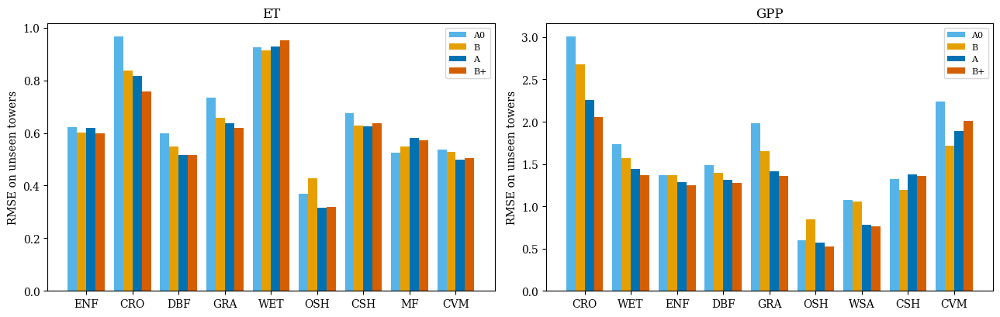

In [11]:
fig, axs = plt.subplots(1, 2, figsize=(13, 4.2))
for ax, t in zip(axs, ['ET', 'GPP']):
    d = data[t]
    classes = d.groupby('igbp').size().sort_values(ascending=False).index[:9]
    w = 0.2
    for j, k in enumerate(SCATTER):
        rm = [metrics(d[d.igbp == c][t].values, preds[(t, k)][d.igbp == c].values)['RMSE'] for c in classes]
        ax.bar(np.arange(len(classes)) + (j - 1.5) * w, rm, w, color=MODEL_COLORS[k], label=SHORT[k])
    ax.set_xticks(range(len(classes))); ax.set_xticklabels(classes); ax.set_ylabel('RMSE on unseen towers'); ax.set_title(t); ax.legend(fontsize=8)
plt.tight_layout()

### **Label efficiency: how many towers do you need?**

The strongest argument in the AlphaEarth paper is not accuracy with abundant labels but accuracy with *few* labels: the representation already contains most of the structure, so a small training set suffices. Flux towers are the scarcest resource in this whole pipeline. We hold out a fixed 20% of towers, then train each model on random subsets of 10, 20, 40, 80, and 160 of the remaining towers and watch the RMSE on the held-out towers. (Fewer trees to keep this fast.)

learning curves done in 43 s


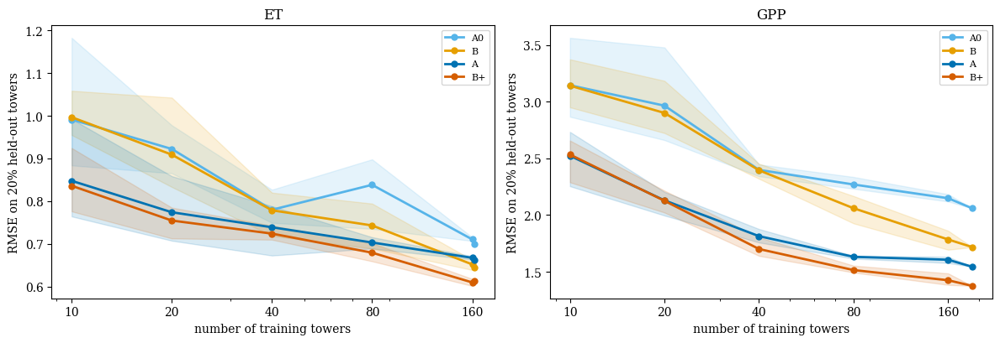

In [12]:
def learning_curve(t, sizes=(10, 20, 40, 80, 160), n_rep=3, n_estimators=100):
    d = data[t]
    tr_idx, te_idx = next(GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=1).split(d, groups=d.site_id))
    train, test = d.iloc[tr_idx], d.iloc[te_idx]
    pool = train.site_id.unique(); rng = np.random.default_rng(0)
    out = []
    for n in [s for s in sizes if s < len(pool)] + [len(pool)]:
        for rep in range(n_rep if n < len(pool) else 1):
            chosen = rng.choice(pool, size=n, replace=False)
            sub = train[train.site_id.isin(chosen)]
            for k in SCATTER:
                m = RandomForestRegressor(n_estimators=n_estimators, min_samples_leaf=5, max_features=0.33, n_jobs=-1, random_state=rep)
                m.fit(sub[FEAT[k]], sub[t])
                out.append({'n_sites': n, 'rep': rep, 'model': k, **metrics(test[t].values, m.predict(test[FEAT[k]]))})
    return pd.DataFrame(out)

t0 = time.time()
lc = {t: learning_curve(t) for t in ['ET', 'GPP']}
print(f'learning curves done in {time.time()-t0:.0f} s')

fig, axs = plt.subplots(1, 2, figsize=(12, 4.2))
for ax, t in zip(axs, ['ET', 'GPP']):
    g = lc[t].groupby(['model', 'n_sites']).RMSE.agg(['mean', 'min', 'max']).reset_index()
    for k in SCATTER:
        gg = g[g.model == k]
        ax.plot(gg.n_sites, gg['mean'], 'o-', color=MODEL_COLORS[k], label=SHORT[k], lw=2, ms=5)
        ax.fill_between(gg.n_sites, gg['min'], gg['max'], color=MODEL_COLORS[k], alpha=0.15)
    ax.set_xscale('log'); ax.set_xlabel('number of training towers'); ax.set_ylabel('RMSE on 20% held-out towers'); ax.set_title(t); ax.legend(fontsize=8)
    ax.set_xticks([10, 20, 40, 80, 160]); ax.set_xticklabels([10, 20, 40, 80, 160])
plt.tight_layout()

Read the curves from left to right. With 10 or 20 towers nothing separates the two annual descriptions: the forest has too few examples to learn how to read either. From about 40 towers on, the embedding (orange) pulls away from the annual NDVI/LAI description (light blue) and keeps improving, while the traditional annual description flattens. The monthly models (dark blue, red) start lower because phenology is worth a lot of towers, and the embedding adds a consistent increment on top of it. The label-efficiency argument holds in the sense that matters for mapping: a given accuracy is reached with fewer towers when the embedding is in the model.

### **Transfer in time**

Leave-site-out tests transfer to new *places*. A map for a future year needs transfer to new *times*. Train on 2017-2021, test on 2022-2024.

In [13]:
rows = []
for t in ['ET', 'GPP']:
    d = data[t]; train, test = d[d.year <= 2021], d[d.year >= 2022]
    for k in MODELS[1:]:
        m = rf().fit(train[FEAT[k]], train[t])
        rows.append({'target': t, 'model': k, **metrics(test[t].values, m.predict(test[FEAT[k]]))})
pd.DataFrame(rows).set_index(['target', 'model']).round(3)

R2   RMSE   bias     n
target model                                                            
ET     M: met only                             0.695  0.877 -0.084  3977
       A0: met + annual NDVI/LAI + land cover  0.803  0.705 -0.043  3977
       B: met + embedding                      0.847  0.621 -0.008  3977
       A: met + monthly NDVI/LAI + land cover  0.845  0.626 -0.030  3977
       B+: met + monthly NDVI/LAI + embedding  0.873  0.565 -0.009  3977
GPP    M: met only                             0.641  2.463 -0.015  4398
       A0: met + annual NDVI/LAI + land cover  0.790  1.886  0.035  4398
       B: met + embedding                      0.823  1.731  0.050  4398
       A: met + monthly NDVI/LAI + land cover  0.874  1.461  0.019  4398
       B+: met + monthly NDVI/LAI + embedding  0.889  1.368  0.017  4398

In this split the test towers are (mostly) *seen* towers in unseen years, so scores are higher than in the leave-site-out test. Notice that the embedding model B now matches or beats the monthly traditional model A: once the model knows a site, the annual vector identifies it well enough that the meteorology can do the rest. Both routes to a map, new places and new years, need to be checked; a model can be good at one and poor at the other.

### **What is the model using? Grouped permutation importance**

Permuting one embedding axis at a time is meaningless (the axes are not individually interpretable), so we permute the whole 64-block together and compare it with the individual meteorological variables and with the vegetation block. The drop in R$^2$ on held-out towers is the importance.

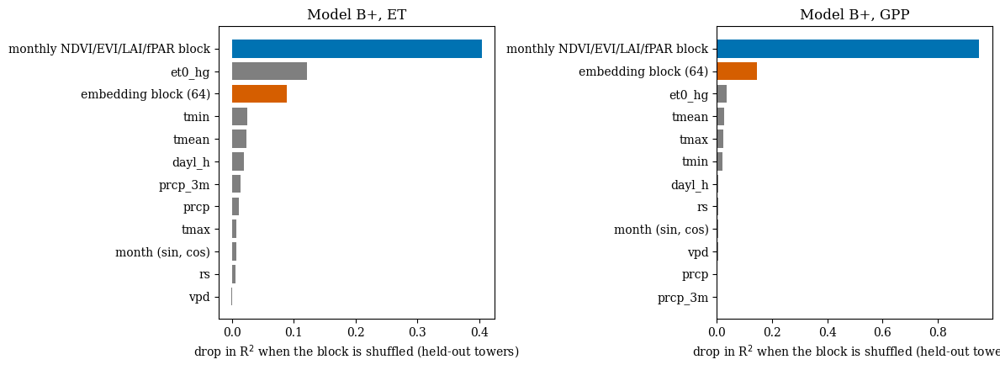

In [14]:
def grouped_importance(model, X, y, groups, n_rep=3, seed=0):
    rng = np.random.default_rng(seed); base = r2_score(y, model.predict(X)); out = {}
    for name, cols in groups.items():
        drops = []
        for _ in range(n_rep):
            Xp = X.copy(); Xp[cols] = X[cols].values[rng.permutation(len(X))]
            drops.append(base - r2_score(y, model.predict(Xp)))
        out[name] = np.mean(drops)
    return pd.Series(out).sort_values()

fig, axs = plt.subplots(1, 2, figsize=(12, 4.5))
for ax, t in zip(axs, ['ET', 'GPP']):
    d = data[t]
    tr_idx, te_idx = next(GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=1).split(d, groups=d.site_id))
    train, test = d.iloc[tr_idx], d.iloc[te_idx]
    k = 'B+: met + monthly NDVI/LAI + embedding'
    m = rf().fit(train[FEAT[k]], train[t])
    groups = {v: [v] for v in MET if not v.startswith('month')}
    groups.update({'month (sin, cos)': ['month_sin', 'month_cos'], 'monthly NDVI/EVI/LAI/fPAR block': VEG, 'embedding block (64)': EMB})
    imp = grouped_importance(m, test[FEAT[k]], test[t].values, groups)
    ax.barh(imp.index, imp.values, color=['#D55E00' if 'embedding' in i else '#0072B2' if 'NDVI' in i else 'tab:gray' for i in imp.index])
    ax.set_xlabel('drop in R$^2$ when the block is shuffled (held-out towers)'); ax.set_title(f'Model B+, {t}')
plt.tight_layout()

The monthly vegetation block dominates: shuffle it and the model loses most of its skill, because it carries both phenology and site identity. The embedding block is the next most important input for GPP and ranks with reference ET for ET. The individual meteorological variables look small only because they are redundant with each other (shuffle `tmean` and `tmax` still tells the model the season); permutation importance measures what is *unique* to a block, not what it contributes in total.

### **The embedding alone: an analog method and a linear probe**

Two experiments that isolate what the embedding knows without any meteorology.

**Analog towers (Model C-kNN).** For a held-out tower, find the five training towers with the most similar embedding and use the average of *their* monthly ET climatology as the prediction. No regression, no weather: "surfaces that look alike behave alike". This is the machine-learning version of the oldest idea in hydrology, the analog catchment.

**Linear probe (Model C-linear).** Regress the *annual mean* ET and GPP of each site-year on the 64 embedding components with ridge regression. If a straight line through embedding space predicts annual fluxes, the representation is very well organized.

In [15]:
emb_site = emb.groupby('site_id')[EMB].mean()
emb_site = emb_site.div(np.linalg.norm(emb_site, axis=1), axis=0)

def knn_analog_cv(df, target, k=5, n_splits=5):
    pred = pd.Series(np.nan, index=df.index)
    for tr, te in GroupKFold(n_splits).split(df, groups=df.site_id):
        train, test = df.iloc[tr], df.iloc[te]
        clim = train.groupby(['site_id', 'month'])[target].mean().unstack()
        for s in test.site_id.unique():
            sims = emb_site.loc[clim.index] @ emb_site.loc[s]
            nbrs = sims.sort_values(ascending=False).index[:k]
            c = clim.loc[nbrs].mean()
            idx = test.index[test.site_id == s]
            pred.loc[idx] = c.reindex(test.loc[idx, 'month']).values
    return pred

rows = []
for t in ['ET', 'GPP']:
    d = data[t]
    p = knn_analog_cv(d, t); preds[(t, 'C-kNN: 5 analog towers')] = p
    rows.append({'target': t, 'model': 'C-kNN: 5 analog towers (monthly, no weather)', **metrics(d[t].values, p.values)})
    # annual means for site-years with at least 10 valid months
    annual = d.groupby(['site_id', 'year']).agg(n=(t, 'size'), y=(t, 'mean'), **{c: (c, 'first') for c in EMB}).reset_index()
    annual = annual[annual.n >= 10]
    pa = cv_predict(annual, EMB, 'y', lambda: RidgeCV(alphas=np.logspace(-3, 2, 12)))
    rows.append({'target': t, 'model': 'C-linear: ridge on embedding (annual mean)', **metrics(annual.y.values, pa.values)})
    pr = cv_predict(annual, EMB, 'y', rf)
    rows.append({'target': t, 'model': 'C-forest: RF on embedding (annual mean)', **metrics(annual.y.values, pr.values)})
    if t == 'ET':
        ann_et, pa_et = annual, pa
pd.DataFrame(rows).set_index(['target', 'model']).round(3)

R2   RMSE   bias  \
target model                                                               
ET     C-kNN: 5 analog towers (monthly, no weather)  0.760  0.765  0.015   
       C-linear: ridge on embedding (annual mean)    0.795  0.359  0.008   
       C-forest: RF on embedding (annual mean)       0.725  0.415 -0.012   
GPP    C-kNN: 5 analog towers (monthly, no weather)  0.744  2.077  0.069   
       C-linear: ridge on embedding (annual mean)    0.692  0.958 -0.014   
       C-forest: RF on embedding (annual mean)       0.644  1.030 -0.009   

                                                         n  
target model                                                
ET     C-kNN: 5 analog towers (monthly, no weather)   9185  
       C-linear: ridge on embedding (annual mean)      630  
       C-forest: RF on embedding (annual mean)         630  
GPP    C-kNN: 5 analog towers (monthly, no weather)  10485  
       C-linear: ridge on embedding (annual mean)      673  
       C-forest: RF on embedding (annual mean)         673

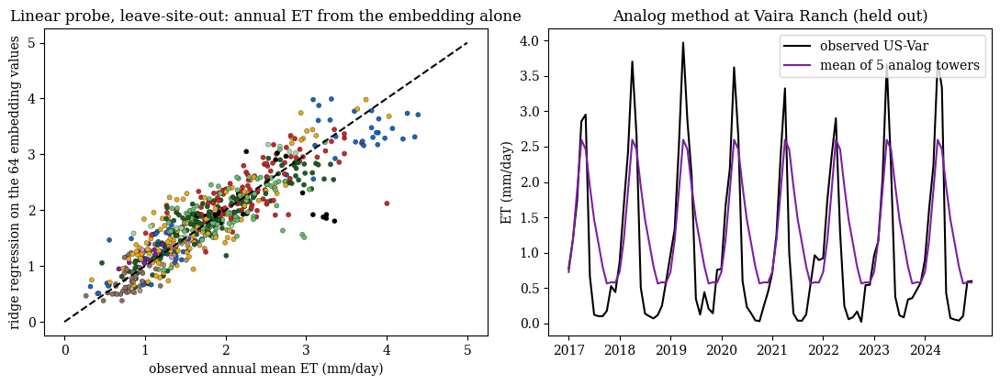

In [16]:
fig, axs = plt.subplots(1, 2, figsize=(11, 4.3))
axs[0].scatter(ann_et.y, pa_et, s=14, c=[class_colors.get(c, 'k') for c in sites.loc[ann_et.site_id, 'igbp']], edgecolor='k', linewidth=0.2)
axs[0].plot([0, 5], [0, 5], 'k--'); axs[0].set_xlabel('observed annual mean ET (mm/day)'); axs[0].set_ylabel('ridge regression on the 64 embedding values')
axs[0].set_title('Linear probe, leave-site-out: annual ET from the embedding alone')
d = data['ET']; sel = d.site_id == 'US-Var'
axs[1].plot(d[sel].month + (d[sel].year - 2017) * 12, d[sel].ET, 'k', label='observed US-Var')
axs[1].plot(d[sel].month + (d[sel].year - 2017) * 12, preds[('ET', 'C-kNN: 5 analog towers')][sel], color='#7b1fa2', label='mean of 5 analog towers')
axs[1].set_xticks(np.arange(1, 97, 12)); axs[1].set_xticklabels(range(2017, 2025)); axs[1].set_ylabel('ET (mm/day)'); axs[1].legend()
axs[1].set_title('Analog method at Vaira Ranch (held out)')
plt.tight_layout()

The linear probe is the striking result: a straight line through embedding space explains about four fifths of the site-to-site variance in annual ET across North America, without a single weather variable. The random forest on the same 64 inputs does worse, which is a hint about the geometry of the representation: it is organized so that fluxes vary smoothly and roughly linearly along it, exactly the property AlphaEarth was trained to have.

The analog method gets the *shape* of the seasonal cycle of a site it has never seen, purely from "which towers look like this one". It cannot know that 2021 was a drought year and 2023 a wet one, and it smooths the peak because the five analogs peak in different months. That is what the meteorology adds in Models B and B+.

## **Step 5: From towers to maps**

Everything so far was evaluated at towers. The reason to build these models is the map. The region is a 40 km x 40 km box around Vaira Ranch on the western Sierra Nevada foothills: annual grassland (US-Var), blue-oak savanna (US-Ton, 2 km away), oak woodland up-slope, irrigated pasture, vineyards and orchards on the valley floor in the south-west, and two reservoirs (Camanche, Pardee).

For an honest test we retrain the models **without US-Var and US-Ton** so that the comparison with those towers is a genuine out-of-sample check, exactly like the cross-validation. The map models are then applied pixel by pixel, month by month, for 2021 (a severe drought year in California) and 2023 (a very wet year).

**Building the predictor stack on the grid.** Every predictor the model saw at the towers must be built identically on the grid: Daymet (1 km) and MODIS (500 m) are resampled to the 100 m grid, Landsat NDVI is gap-filled through time as at the towers, land cover is one-hot encoded, Hargreaves ET$_0$ uses each pixel's latitude. Water pixels are masked: no tower stands on a lake.

In [17]:
REGION = ['alphaearth_embedding_2021_100m.tif', 'alphaearth_embedding_2023_100m.tif', 'alphaearth_similarity_to_2021_100m.tif',
          'landsat_ndvi_monthly_2021_100m.tif', 'landsat_ndvi_monthly_2023_100m.tif', 'openet_ensemble_et_monthly_2021_100m.tif',
          'openet_ensemble_et_monthly_2023_100m.tif', 'elevation_100m.tif', 'daymet_monthly_2017_2024_1km.tif',
          'modis_vegetation_monthly_2017_2024_500m.tif', 'mod16_et_monthly_2017_2024_500m.tif', 'mod17_gpp_monthly_2017_2024_500m.tif',
          'modis_landcover_2021_500m.tif']
rpaths = {f: get_data('alphaearth/region/' + f) for f in REGION}

def read_tif(fname):
    """Read a region raster: (bands, rows, cols) float32 with nodata -> NaN and the scale factor applied."""
    with rasterio.open(rpaths[fname]) as src:
        arr = src.read().astype('float32')
        if src.nodata is not None:
            arr[arr == src.nodata] = np.nan
        arr[~np.isfinite(arr)] = np.nan
        arr *= float(src.tags().get('scale_factor', 1))
        return arr, list(src.descriptions), src.transform, src.crs

def to_grid(arr, src_transform, src_crs, like_shape, like_transform, like_crs, method=Resampling.bilinear):
    """Resample a (bands, r, c) array onto the 100 m grid."""
    out = np.full((arr.shape[0],) + like_shape, np.nan, dtype='float32')
    for i in range(arr.shape[0]):
        reproject(arr[i], out[i], src_transform=src_transform, src_crs=src_crs, dst_transform=like_transform, dst_crs=like_crs,
                  src_nodata=np.nan, dst_nodata=np.nan, resampling=method)
    return out

E21, _, T100, CRS = read_tif('alphaearth_embedding_2021_100m.tif')
SHAPE = E21.shape[1:]
elev, *_ = read_tif('elevation_100m.tif')
lc_arr, _, T500, _ = read_tif('modis_landcover_2021_500m.tif')
lc100 = to_grid(lc_arr, T500, CRS, SHAPE, T100, CRS, Resampling.nearest)[0]
water = lc100 == 17
daymet, dm_names, T1k, _ = read_tif('daymet_monthly_2017_2024_1km.tif')
modis, md_names, _, _ = read_tif('modis_vegetation_monthly_2017_2024_500m.tif')
mod16, m16_names, _, _ = read_tif('mod16_et_monthly_2017_2024_500m.tif')
mod17, m17_names, _, _ = read_tif('mod17_gpp_monthly_2017_2024_500m.tif')

# pixel-centre coordinates (UTM) and latitude (for Hargreaves)
rows_, cols_ = np.indices(SHAPE)
xs = T100.c + (cols_ + 0.5) * T100.a; ys = T100.f + (rows_ + 0.5) * T100.e
lon_g, lat_g = rasterio.warp.transform(CRS, 'EPSG:4326', xs.ravel(), ys.ravel())
lat_g = np.array(lat_g).reshape(SHAPE); lon_g = np.array(lon_g).reshape(SHAPE)
extent = [T100.c, T100.c + SHAPE[1] * T100.a, T100.f + SHAPE[0] * T100.e, T100.f]   # for imshow, metres
extent_km = [(v - extent[0]) / 1000 if i < 2 else (v - extent[2]) / 1000 for i, v in enumerate(extent)]

def tower_rc(site):
    x, y = rasterio.warp.transform('EPSG:4326', CRS, [sites.loc[site, 'lon']], [sites.loc[site, 'lat']])
    r, c = rasterio.transform.rowcol(T100, x[0], y[0]); return r, c
def tower_km(site):
    r, c = tower_rc(site); return (c + 0.5) * 0.1, (SHAPE[0] - r - 0.5) * 0.1
print('grid:', SHAPE, 'pixels of 100 m;', f'{water.mean()*100:.1f}% water;', 'US-Var at row/col', tower_rc('US-Var'))

grid: (409, 403) pixels of 100 m; 1.5% water; US-Var at row/col (np.int32(166), np.int32(265))


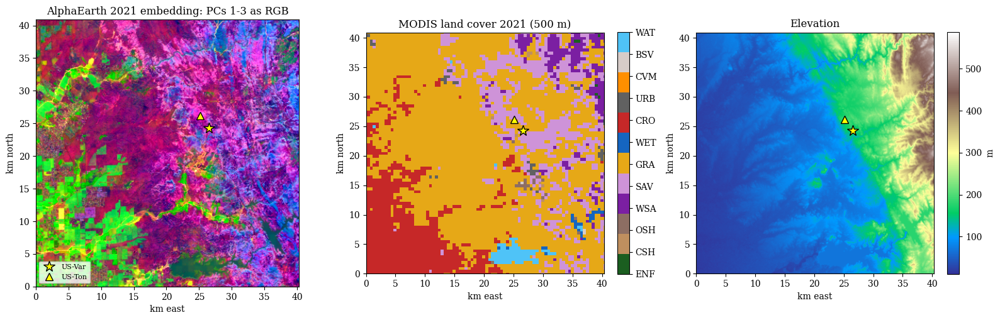

In [18]:
# The embedding as an image: the first three principal components (fitted on the towers) as RGB
pca3 = PCA(n_components=3).fit(e21[EMB])
comp = pca3.transform(E21.reshape(64, -1).T).reshape(SHAPE + (3,))
lo, hi = np.nanpercentile(comp, 2, axis=(0, 1)), np.nanpercentile(comp, 98, axis=(0, 1))
rgb = np.clip((comp - lo) / (hi - lo), 0, 1)

fig, axs = plt.subplots(1, 3, figsize=(16, 5.2))
axs[0].imshow(rgb, extent=extent_km); axs[0].set_title('AlphaEarth 2021 embedding: PCs 1-3 as RGB')
lc_names = {1: 'ENF', 2: 'EBF', 3: 'DNF', 4: 'DBF', 5: 'MF', 6: 'CSH', 7: 'OSH', 8: 'WSA', 9: 'SAV', 10: 'GRA', 11: 'WET', 12: 'CRO', 13: 'URB', 14: 'CVM', 15: 'SNO', 16: 'BSV', 17: 'WAT'}
present = [int(v) for v in np.unique(lc100[np.isfinite(lc100)])]
cmap = mcolors.ListedColormap([class_colors.get(lc_names[v], {'WAT': '#4fc3f7', 'URB': '#616161', 'CVM': '#ff8f00', 'BSV': '#d7ccc8'}.get(lc_names[v], 'k')) for v in present])
im = axs[1].imshow(np.searchsorted(present, lc100), cmap=cmap, extent=extent_km, interpolation='nearest')
cb = plt.colorbar(im, ax=axs[1], ticks=range(len(present)), fraction=0.046); cb.ax.set_yticklabels([lc_names[v] for v in present])
axs[1].set_title('MODIS land cover 2021 (500 m)')
im = axs[2].imshow(elev[0], cmap='terrain', extent=extent_km); plt.colorbar(im, ax=axs[2], fraction=0.046, label='m'); axs[2].set_title('Elevation')
for ax in axs:
    for s, mk in [('US-Var', '*'), ('US-Ton', '^')]:
        ax.plot(*tower_km(s), mk, color='yellow', mec='k', ms=13 if mk == '*' else 9, label=s)
    ax.set_xlabel('km east'); ax.set_ylabel('km north')
axs[0].legend(loc='lower left', fontsize=8); plt.tight_layout()

The RGB rendering is not a photograph: each color is a direction in embedding space. Yet the map is legible: valley agriculture, reservoirs, grassland, and the wooded foothills each get their own color, and field boundaries are sharp at 100 m. This is the surface description the flux model will read.

In [19]:
def fill_time(a):
    """Fill NaN months with the mean of the previous and next valid month (a: (12, N))."""
    df = pd.DataFrame(a); f = df.ffill().values; b = df.bfill().values
    return np.where(np.isnan(f), b, np.where(np.isnan(b), f, (f + b) / 2))

def region_features(year):
    """Monthly predictor stacks for one year on the 100 m grid. Returns dict month -> DataFrame (pixels x ALL_PRED) and the embedding array."""
    E, *_ = read_tif(f'alphaearth_embedding_{year}_100m.tif')
    # Daymet: 1 km -> 100 m (bilinear), months of this year plus the last two of the previous year for antecedent rain
    dm_vars = ['tmax', 'tmin', 'srad', 'vp', 'dayl', 'prcp']
    keys = [f'{year-1}-11', f'{year-1}-12'] + [f'{year}-{m:02d}' for m in range(1, 13)]
    idx = [dm_names.index(f'{v}_{k}') for k in keys for v in dm_vars]
    dm = to_grid(daymet[idx], T1k, CRS, SHAPE, T100, CRS).reshape(len(keys), len(dm_vars), -1)
    # MODIS vegetation: 500 m -> 100 m
    md_vars = ['ndvi_modis', 'evi_modis', 'lai_modis', 'fpar_modis']
    idx = [md_names.index(f'{v}_{year}-{m:02d}') for m in range(1, 13) for v in md_vars]
    md = to_grid(modis[idx], T500, CRS, SHAPE, T100, CRS).reshape(12, len(md_vars), -1)
    # Landsat NDVI, gap-filled through time, then with MODIS NDVI
    ls, *_ = read_tif(f'landsat_ndvi_monthly_{year}_100m.tif')
    ndvi = fill_time(ls.reshape(12, -1))
    ndvi = np.where(np.isnan(ndvi), md[:, 0, :], ndvi)
    static = pd.DataFrame({'elev_m': elev[0].ravel()})
    for c in LC_CLASSES:
        static[f'lc_{c}'] = (lc100.ravel() == c).astype('float32')
    static['ndvi_mean'] = np.nanmean(ndvi, axis=0); static['ndvi_max'] = np.nanmax(ndvi, axis=0); static['ndvi_min'] = np.nanmin(ndvi, axis=0)
    static['lai_mean'] = np.nanmean(md[:, 2, :], axis=0); static['lai_max'] = np.nanmax(md[:, 2, :], axis=0)
    static[EMB] = E.reshape(64, -1).T
    feats = {}
    for m in range(1, 13):
        k = m + 1     # index in `keys`
        df = pd.DataFrame(dm[k].T, columns=dm_vars); df['month'] = m
        df = add_met_features(df, lat_g.ravel())
        df['prcp_3m'] = dm[k-2:k+1, dm_vars.index('prcp'), :].mean(axis=0)
        df[md_vars] = md[m-1].T; df['ndvi'] = ndvi[m-1]
        feats[m] = pd.concat([df, static], axis=1)[ALL_PRED].astype('float32')
    return feats, E

t0 = time.time()
feats21, E21 = region_features(2021)
print(f'2021 predictor stack: 12 months x {len(feats21[1])} pixels x {feats21[1].shape[1]} predictors, {time.time()-t0:.0f} s')

2021 predictor stack: 12 months x 164827 pixels x 103 predictors, 3 s


In [20]:
# map models: trained on every tower except US-Var and US-Ton
MAP_MODELS = ['A: met + monthly NDVI/LAI + land cover', 'B: met + embedding', 'B+: met + monthly NDVI/LAI + embedding']
map_models = {}
t0 = time.time()
for t in ['ET', 'GPP']:
    d = data[t][~data[t].site_id.isin(['US-Var', 'US-Ton'])]
    for k in MAP_MODELS:
        map_models[(t, k)] = rf().fit(d[FEAT[k]], d[t])
print(f'6 map models trained in {time.time()-t0:.0f} s')

def predict_maps(feats, target, model_key):
    m = map_models[(target, model_key)]
    out = np.full((12,) + SHAPE, np.nan, dtype='float32')
    for mo in range(1, 13):
        X = feats[mo][FEAT[model_key]]
        ok = np.isfinite(X.values).all(axis=1) & ~water.ravel()
        p = np.full(len(X), np.nan, dtype='float32'); p[ok] = m.predict(X[ok])
        out[mo-1] = p.reshape(SHAPE)
    return out

t0 = time.time()
maps21 = {(t, k): predict_maps(feats21, t, k) for t in ['ET', 'GPP'] for k in MAP_MODELS}
del feats21
print(f'2021 maps: 12 months x 6 model-target pairs in {time.time()-t0:.0f} s')

6 map models trained in 11 s


2021 maps: 12 months x 6 model-target pairs in 23 s


Text(0.5, 0.93, 'Monthly ET around Vaira Ranch in the 2021 drought year, predicted from AlphaEarth embeddings + Daymet + NDVI')

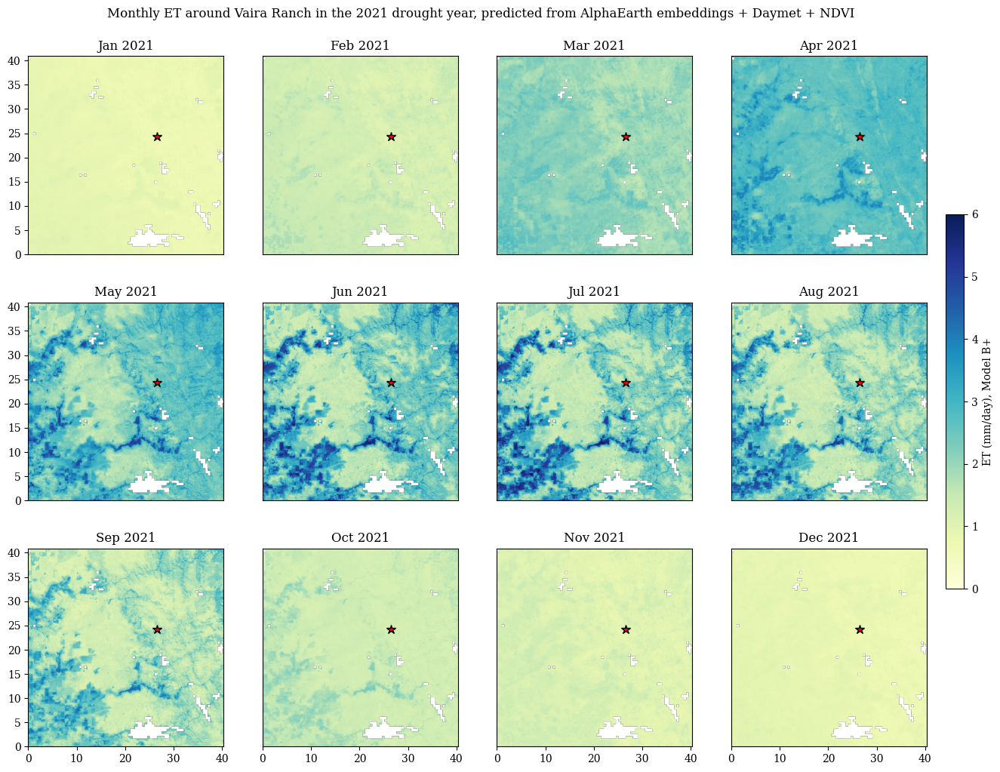

In [21]:
# reference products for 2021 on the 100 m grid
openet21, *_ = read_tif('openet_ensemble_et_monthly_2021_100m.tif')
m16_21 = to_grid(mod16[[m16_names.index(f'2021-{m:02d}') for m in range(1, 13)]], T500, CRS, SHAPE, T100, CRS, Resampling.nearest)
m17_21 = to_grid(mod17[[m17_names.index(f'2021-{m:02d}') for m in range(1, 13)]], T500, CRS, SHAPE, T100, CRS, Resampling.nearest)
for a in (openet21, m16_21, m17_21):
    a[:, water] = np.nan

months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
fig, axs = plt.subplots(3, 4, figsize=(16, 12))
for i, ax in enumerate(axs.ravel()):
    im = ax.imshow(maps21[('ET', MAP_MODELS[2])][i], cmap='YlGnBu', vmin=0, vmax=6, extent=extent_km)
    ax.set_title(f'{months[i]} 2021'); ax.plot(*tower_km('US-Var'), '*', color='red', mec='k', ms=9)
    if i % 4: ax.set_yticks([])
    if i < 8: ax.set_xticks([])
fig.colorbar(im, ax=axs, fraction=0.02, pad=0.02, label='ET (mm/day), Model B+')
fig.suptitle('Monthly ET around Vaira Ranch in the 2021 drought year, predicted from AlphaEarth embeddings + Daymet + NDVI', y=0.93)

The seasonal story of a Mediterranean landscape is there: the whole region is quiet in winter, the rangeland around the red star is brightest in April when the annual grass peaks, and from May onward the map splits into the irrigated fields, orchards and riparian corridors of the valley floor at 3-6 mm/day and the drying uplands at 1-2 mm/day. Look closely at the rangeland in July and August, though: the model still gives it 1-2 mm/day. Whether that is right is the next question. We have three independent references for ET (OpenET ensemble at 30 m aggregated to 100 m, MOD16 at 500 m, and the two towers) and two for GPP (MOD17 and the towers).

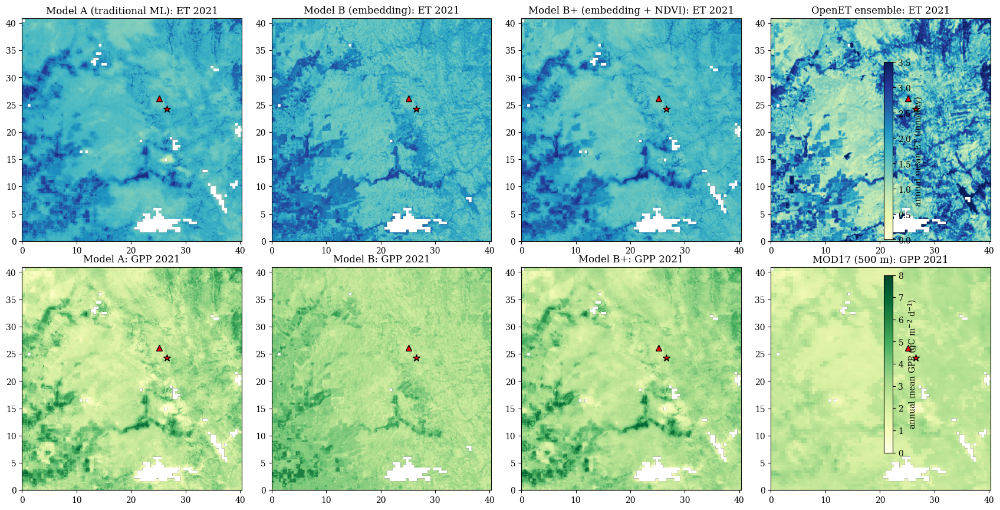

In [22]:
ann = {k: np.nanmean(v, axis=0) for k, v in maps21.items()}
ann['OpenET'] = np.nanmean(openet21, axis=0); ann['MOD16'] = np.nanmean(m16_21, axis=0); ann['MOD17'] = np.nanmean(m17_21, axis=0)

fig, axs = plt.subplots(2, 4, figsize=(17, 8.6))
panels_et = [(MAP_MODELS[0], 'Model A (traditional ML)'), (MAP_MODELS[1], 'Model B (embedding)'), (MAP_MODELS[2], 'Model B+ (embedding + NDVI)'), ('OpenET', 'OpenET ensemble')]
for ax, (k, title) in zip(axs[0], panels_et):
    im = ax.imshow(ann[('ET', k)] if k in MAP_MODELS else ann[k], cmap='YlGnBu', vmin=0, vmax=3.5, extent=extent_km); ax.set_title(f'{title}: ET 2021')
fig.colorbar(im, ax=axs[0], fraction=0.02, pad=0.01, label='annual mean ET (mm/day)')
panels_gpp = [(MAP_MODELS[0], 'Model A'), (MAP_MODELS[1], 'Model B'), (MAP_MODELS[2], 'Model B+'), ('MOD17', 'MOD17 (500 m)')]
for ax, (k, title) in zip(axs[1], panels_gpp):
    im = ax.imshow(ann[('GPP', k)] if k in MAP_MODELS else ann[k], cmap='YlGn', vmin=0, vmax=8, extent=extent_km); ax.set_title(f'{title}: GPP 2021')
fig.colorbar(im, ax=axs[1], fraction=0.02, pad=0.01, label='annual mean GPP (gC m$^{-2}$ d$^{-1}$)')
for ax in axs.ravel():
    ax.plot(*tower_km('US-Var'), '*', color='red', mec='k', ms=9); ax.plot(*tower_km('US-Ton'), '^', color='red', mec='k', ms=7)
plt.tight_layout()

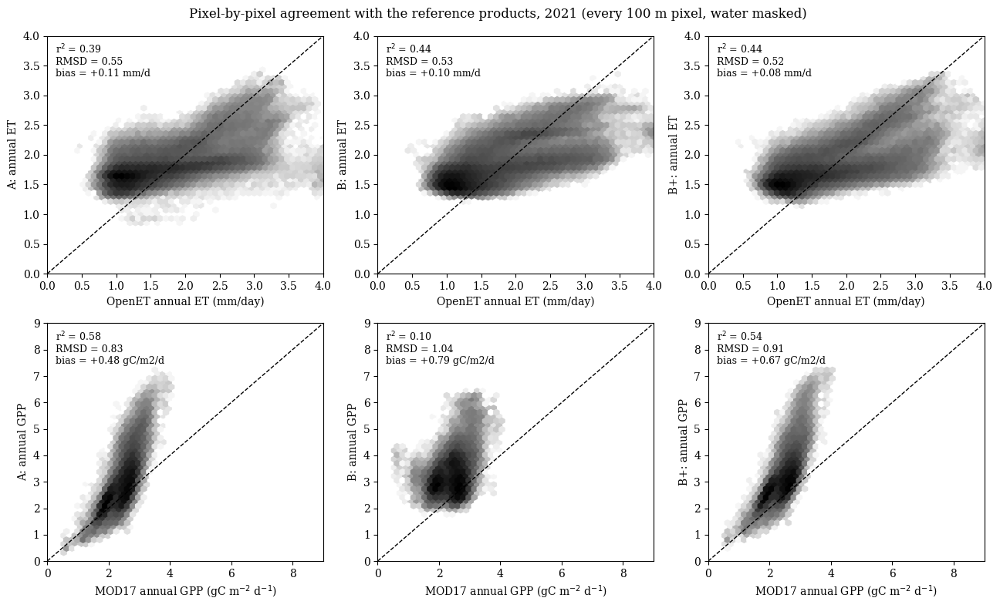

In [23]:
def compare_pixels(a, b, label_a, label_b, ax, lim, unit):
    m = np.isfinite(a) & np.isfinite(b)
    ax.hexbin(b[m], a[m], gridsize=50, extent=lim * 2, cmap='Greys', mincnt=1, bins='log')
    ax.plot(lim, lim, 'k--', lw=1); ax.set_xlim(lim); ax.set_ylim(lim)
    r = metrics(b[m], a[m])
    ax.text(0.03, 0.97, f"r$^2$ = {np.corrcoef(a[m], b[m])[0,1]**2:.2f}\nRMSD = {r['RMSE']:.2f}\nbias = {r['bias']:+.2f} {unit}", transform=ax.transAxes, va='top', fontsize=9)
    ax.set_xlabel(label_b); ax.set_ylabel(label_a)

fig, axs = plt.subplots(2, 3, figsize=(13, 8))
for j, k in enumerate(MAP_MODELS):
    compare_pixels(ann[('ET', k)], ann['OpenET'], f'{k.split(":")[0]}: annual ET', 'OpenET annual ET (mm/day)', axs[0, j], [0, 4], 'mm/d')
    compare_pixels(ann[('GPP', k)], ann['MOD17'], f'{k.split(":")[0]}: annual GPP', 'MOD17 annual GPP (gC m$^{-2}$ d$^{-1}$)', axs[1, j], [0, 9], 'gC/m2/d')
fig.suptitle('Pixel-by-pixel agreement with the reference products, 2021 (every 100 m pixel, water masked)'); plt.tight_layout()

Agreement with OpenET and MOD17 is a consistency check, not a validation: those products have their own errors (MOD17 in particular is known to underestimate crop GPP, and OpenET is itself a model ensemble). The towers are the ground truth we have, so the decisive comparison is at Vaira Ranch and Tonzi Ranch, both of which were withheld from the map models.

R2  RMSE  bias   n
site   target product                      
US-Var ET     A       -0.18  1.04  0.70  12
              B       -0.30  1.09  0.55  12
              B+      -0.25  1.07  0.63  12
              OpenET   0.21  0.85  0.34  12
              MOD16    0.76  0.47  0.04  12
       GPP    A        0.63  1.34  0.57  12
              B       -0.26  2.47  0.62  12
              B+       0.70  1.21  0.65  12
              MOD17    0.51  1.54  0.57  12
US-Ton ET     A       -1.00  0.94  0.76  12
              B       -1.64  1.09  0.74  12
              B+      -0.79  0.89  0.64  12
              OpenET  -2.53  1.26  1.01  12
              MOD16    0.78  0.32  0.02  12
       GPP    A        0.67  0.76  0.42  12
              B        0.06  1.28  0.50  12
              B+       0.65  0.78  0.51  12
              MOD17    0.59  0.84  0.57  12

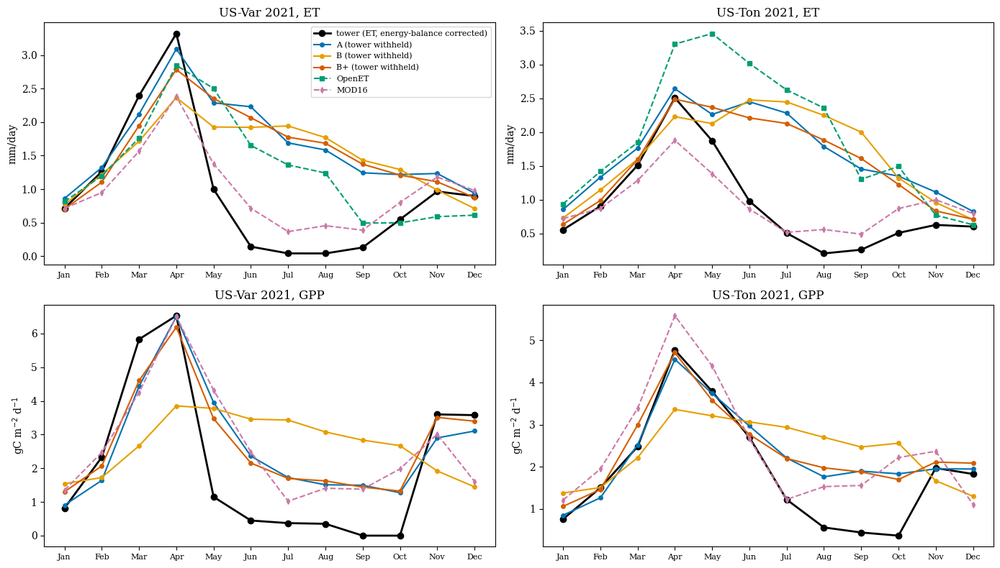

In [24]:
def series_at(arr, site, half=1):
    r, c = tower_rc(site)
    return np.nanmean(arr[:, r-half:r+half+1, c-half:c+half+1], axis=(1, 2))

fig, axs = plt.subplots(2, 2, figsize=(14, 8))
for i, site in enumerate(['US-Var', 'US-Ton']):
    for j, (t, ref, refname) in enumerate([('ET', openet21, 'OpenET'), ('GPP', None, None)]):
        ax = axs[j, i]
        obs = mon[(mon.site_id == site) & (mon.year == 2021)].set_index('month')[t].reindex(range(1, 13))
        ax.plot(range(1, 13), obs, 'ko-', lw=2, label=f'tower ({t}, energy-balance corrected)' if t == 'ET' else 'tower GPP')
        for k in MAP_MODELS:
            ax.plot(range(1, 13), series_at(maps21[(t, k)], site), 'o-', ms=4, color=MODEL_COLORS[k], label=k.split(':')[0] + ' (tower withheld)')
        if t == 'ET':
            ax.plot(range(1, 13), series_at(openet21, site), 's--', ms=4, color='#009E73', label='OpenET')
            ax.plot(range(1, 13), series_at(m16_21, site), 'd--', ms=4, color='#CC79A7', label='MOD16')
        else:
            ax.plot(range(1, 13), series_at(m17_21, site), 'd--', ms=4, color='#CC79A7', label='MOD17')
        ax.set_xticks(range(1, 13)); ax.set_xticklabels(months, fontsize=8); ax.set_title(f'{site} 2021, {t}')
        ax.set_ylabel('mm/day' if t == 'ET' else 'gC m$^{-2}$ d$^{-1}$')
        if i == 0 and j == 0: ax.legend(fontsize=8)
plt.tight_layout()

rows = []
for site in ['US-Var', 'US-Ton']:
    for t in ['ET', 'GPP']:
        obs = mon[(mon.site_id == site) & (mon.year == 2021)].set_index('month')[t].reindex(range(1, 13)).values
        cands = {k.split(':')[0]: series_at(maps21[(t, k)], site) for k in MAP_MODELS}
        if t == 'ET': cands.update({'OpenET': series_at(openet21, site), 'MOD16': series_at(m16_21, site)})
        else: cands['MOD17'] = series_at(m17_21, site)
        for name, sim in cands.items():
            rows.append({'site': site, 'target': t, 'product': name, **metrics(obs, sim)})
pd.DataFrame(rows).set_index(['site', 'target', 'product']).round(2)

This is the most instructive figure in the notebook, and not because the models look good. In the wet season every product tracks the towers. From June to October the tower measures almost nothing at Vaira Ranch (the annual grass is dead and the soil is dry), yet Models A, B and B+ all keep evaporating 1-2 mm/day, and OpenET does the same until September. Only MOD16, a Penman-Monteith model with an explicit soil-moisture constraint from relative humidity, follows the tower down.

Why do three data-driven models fail in the same way? Because a five-month rainless summer over dead grass is rare in the training set: most North American grassland towers get summer rain. Leave-site-out with US-Var and US-Ton withheld leaves only a handful of similar sites, and a random forest cannot extrapolate to a combination of hot, dry and dead that it has hardly seen. Notice that the five-analog method of Step 4, which only used the embedding to find those few similar towers, put summer ET near 0.5 mm/day, closer to the truth than the forests. The embedding knows which towers to look at; the forest does not weight them enough.

GPP tells the same story in the dry season and a happier one in spring: the monthly NDVI models (A, B+) reproduce the March-April peak and the timing of senescence, while the annual embedding alone (B) cannot see the grass die back.

The lesson is the one from Notebook 09: where the physics is known (no water, no ET), put it in the model; where it is not, let the data speak. A hybrid that scales a physical potential ET by a learned surface factor would not make this mistake.

### **Fluxes by land cover, and the value of 100 m**

Averaging the annual maps by MODIS land-cover class shows what each product thinks the different surfaces do. Then zoom into the south-west corner where irrigated fields meet dry rangeland: this is where spatial resolution matters for water accounting, and where a 500 m product blurs the two together.

Annual mean ET 2021 (mm/day) by land cover:


,Model A,Model B,Model B+,OpenET,MOD16
CSH (2 km2),1.84,1.83,1.72,2.53,0.89
OSH (5 km2),1.53,2.04,1.69,2.31,0.71
WSA (71 km2),2.04,1.89,1.97,2.52,1.15
SAV (243 km2),1.82,1.78,1.78,2.05,1.02
GRA (1038 km2),1.75,1.74,1.70,1.53,0.89
WET (7 km2),1.74,2.16,1.93,3.53,0.74
CRO (246 km2),2.18,2.26,2.24,1.97,1.06
URB (9 km2),1.69,2.10,1.93,1.83,0.70


Text(0.5, 1.0, 'Irrigated valley floor meets rangeland: 15 km x 15 km, south-west corner')

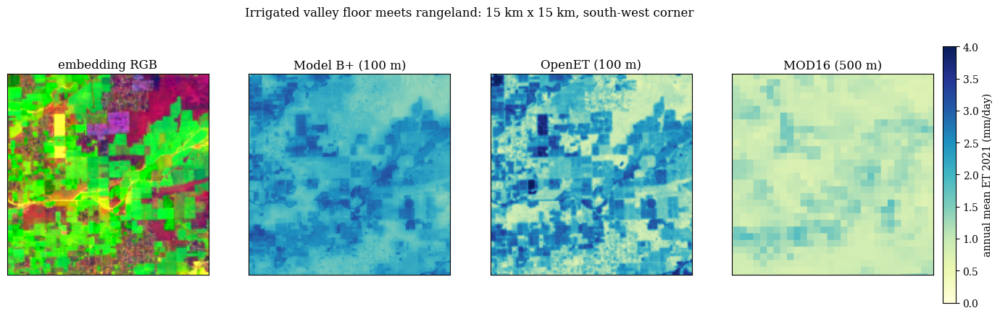

In [25]:
classes_here = [v for v in present if v != 17 and (lc100 == v).sum() > 200]
tab = pd.DataFrame({name: [np.nanmean(arr[lc100 == v]) for v in classes_here]
                    for name, arr in [('Model A', ann[('ET', MAP_MODELS[0])]), ('Model B', ann[('ET', MAP_MODELS[1])]), ('Model B+', ann[('ET', MAP_MODELS[2])]),
                                      ('OpenET', ann['OpenET']), ('MOD16', ann['MOD16'])]},
                   index=[f'{lc_names[v]} ({(lc100 == v).sum()/100:.0f} km2)' for v in classes_here])
print('Annual mean ET 2021 (mm/day) by land cover:'); display(tab.round(2))

r0, r1, c0, c1 = SHAPE[0] - 150, SHAPE[0], 0, 150      # south-west corner, 15 km x 15 km
fig, axs = plt.subplots(1, 4, figsize=(17, 4.6))
for ax, (arr, title) in zip(axs, [(rgb[r0:r1, c0:c1], 'embedding RGB'), (ann[('ET', MAP_MODELS[2])][r0:r1, c0:c1], 'Model B+ (100 m)'),
                                  (ann['OpenET'][r0:r1, c0:c1], 'OpenET (100 m)'), (ann['MOD16'][r0:r1, c0:c1], 'MOD16 (500 m)')]):
    if title == 'embedding RGB': ax.imshow(arr)
    else: im = ax.imshow(arr, cmap='YlGnBu', vmin=0, vmax=4)
    ax.set_title(title); ax.set_xticks([]); ax.set_yticks([])
fig.colorbar(im, ax=axs, fraction=0.02, pad=0.01, label='annual mean ET 2021 (mm/day)')
fig.suptitle('Irrigated valley floor meets rangeland: 15 km x 15 km, south-west corner', y=1.0)

### **A wet year: does the model respond to weather, or only to the surface?**

2023 followed the drought with one of California's wettest winters. If the model has learned something about weather rather than a lookup table of surfaces, the same pixels should respond: more spring ET where water was limiting (rangeland), little change where it was not (irrigated crops get water either way). We rebuild the predictor stack for 2023, predict, and compare the 2023 minus 2021 difference with OpenET's, and then look at the two years month by month at the Vaira Ranch pixel.

2023 done in 14 s
Mean ET change 2023 - 2021 (mm/day) by land cover:


,CSH,OSH,WSA,SAV,GRA,WET,CRO,URB
Model B+,0.02,-0.00,-0.02,-0.02,0.02,-0.09,0.03,-0.01
OpenET,-0.16,-0.09,-0.11,-0.07,-0.03,-0.22,-0.02,-0.22


US-Var tower annual mean ET: 2021 = 0.95, 2023 = 1.03 mm/day; Model B+ at the tower pixel: 2021 = 1.58, 2023 = 1.55; OpenET: 2021 = 1.30, 2023 = 1.31

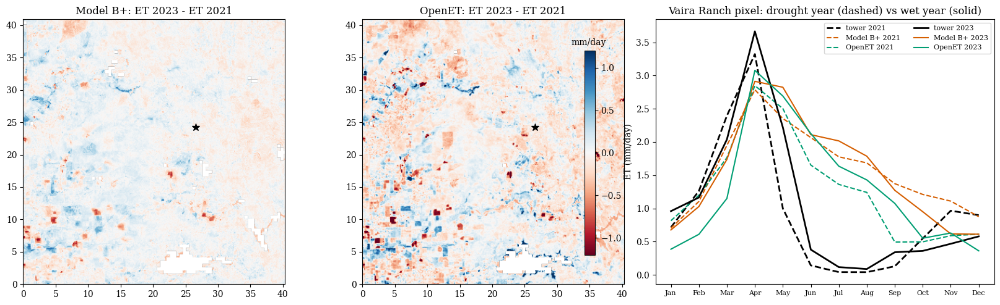

In [26]:
t0 = time.time()
feats23, E23 = region_features(2023)
maps23 = {('ET', k): predict_maps(feats23, 'ET', k) for k in MAP_MODELS}
openet23, *_ = read_tif('openet_ensemble_et_monthly_2023_100m.tif'); openet23[:, water] = np.nan
print(f'2023 done in {time.time()-t0:.0f} s')

d_model = np.nanmean(maps23[('ET', MAP_MODELS[2])], axis=0) - ann[('ET', MAP_MODELS[2])]
d_open = np.nanmean(openet23, axis=0) - ann['OpenET']
fig, axs = plt.subplots(1, 3, figsize=(17, 5), gridspec_kw={'width_ratios': [1, 1, 1.1]})
for ax, arr, title in [(axs[0], d_model, 'Model B+: ET 2023 - ET 2021'), (axs[1], d_open, 'OpenET: ET 2023 - ET 2021')]:
    im = ax.imshow(arr, cmap='RdBu', vmin=-1.2, vmax=1.2, extent=extent_km); ax.set_title(title); ax.plot(*tower_km('US-Var'), 'k*', ms=9)
fig.colorbar(im, ax=axs[:2], fraction=0.02, pad=0.01).set_label('mm/day', labelpad=-38, y=1.06, rotation=0)
for y, style, m21, o21 in [(2021, '--', maps21, openet21), (2023, '-', maps23, openet23)]:
    obs = mon[(mon.site_id == 'US-Var') & (mon.year == y)].set_index('month').ET.reindex(range(1, 13))
    axs[2].plot(range(1, 13), obs, 'k' + style, lw=2, label=f'tower {y}')
    axs[2].plot(range(1, 13), series_at(m21[('ET', MAP_MODELS[2])], 'US-Var'), style, color='#D55E00', label=f'Model B+ {y}')
    axs[2].plot(range(1, 13), series_at(o21, 'US-Var'), style, color='#009E73', label=f'OpenET {y}')
axs[2].set_xticks(range(1, 13)); axs[2].set_xticklabels(months, fontsize=8); axs[2].set_ylabel('ET (mm/day)'); axs[2].legend(fontsize=8, ncol=2)
axs[2].set_title('Vaira Ranch pixel: drought year (dashed) vs wet year (solid)')
plt.tight_layout()

tab = pd.DataFrame({'Model B+': [np.nanmean(d_model[lc100 == v]) for v in classes_here], 'OpenET': [np.nanmean(d_open[lc100 == v]) for v in classes_here]},
                   index=[lc_names[v] for v in classes_here])
print('Mean ET change 2023 - 2021 (mm/day) by land cover:'); display(tab.round(2).T)
obs = mon[mon.site_id == 'US-Var'].groupby('year').ET.mean()
print(f"US-Var tower annual mean ET: 2021 = {obs[2021]:.2f}, 2023 = {obs[2023]:.2f} mm/day; Model B+ at the tower pixel: "
      f"2021 = {series_at(maps21[('ET', MAP_MODELS[2])], 'US-Var').mean():.2f}, 2023 = {series_at(maps23[('ET', MAP_MODELS[2])], 'US-Var').mean():.2f}; "
      f"OpenET: 2021 = {series_at(openet21, 'US-Var').mean():.2f}, 2023 = {series_at(openet23, 'US-Var').mean():.2f}")

The annual difference is small and patchy in both products, and that is the right answer: at the tower the two years differ by less than 0.1 mm/day in the annual mean. What the wet year changes is the *timing*. The tower's spring peak comes later and lasts longer in 2023 (a cool, wet spring delays green-up and keeps the grass alive into May), and Model B+ reproduces that shift because Daymet tells it so. The summer overestimate is the same in both years, which confirms that it is a property of the training set, not of the weather.

Note also what the embedding contributes here: the 2023 map used the 2023 embedding. Where a field was fallowed or planted between the two years, the embedding changed and the prediction with it, which is the next topic.

## **Step 6: The embedding as a change detector**

The same dot product that found analog towers finds *change*. For each pixel, the similarity between its 2021 vector and its vector in every other year is a one-number summary of how much the surface changed, from all sensors at once. The prep script computed these maps on Earth Engine (`sim_2017` ... `sim_2024`, each relative to 2021). A second product of the same idea is the similarity of every pixel to the *tower* embedding: a map of "how Vaira-like is this place", the spatial form of the analog method from Step 4.

2023-vs-2021 similarity: median 0.873; 5% of land pixels below 0.800
Land cover of the 5% most-changed pixels: WSA 5%, SAV 17%, GRA 56%, CRO 17%
Mean ET change 2023-2021 (OpenET): most-changed pixels +0.01 mm/day vs all land -0.04 mm/day


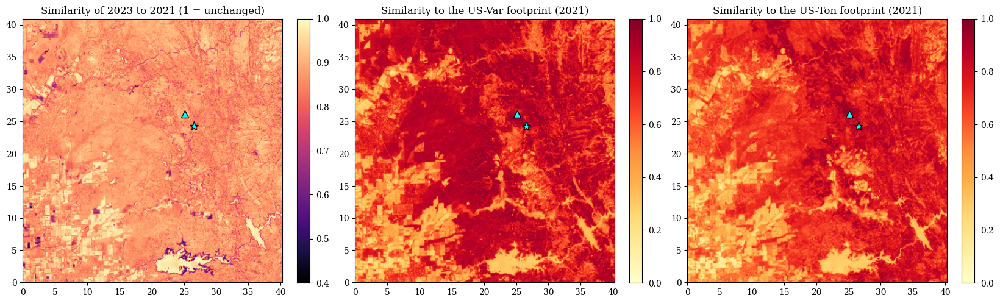

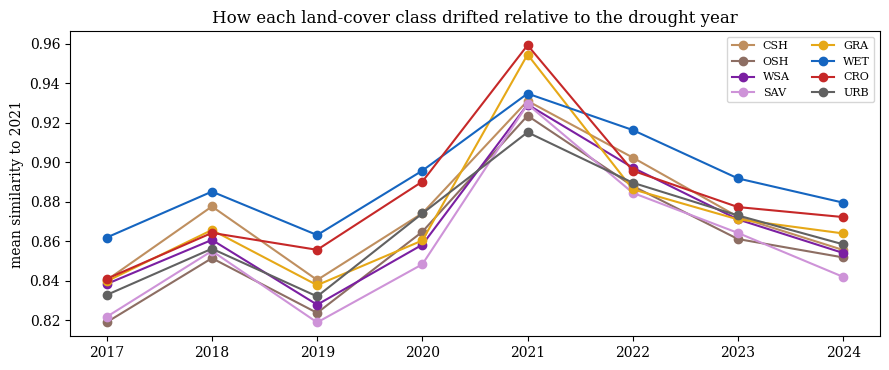

In [27]:
sim, sim_names, *_ = read_tif('alphaearth_similarity_to_2021_100m.tif')
sim_var_map = np.tensordot(e21n.loc['US-Var'].values.astype('float32'), E21, axes=(0, 0))
sim_ton_map = np.tensordot(e21n.loc['US-Ton'].values.astype('float32'), E21, axes=(0, 0))

fig, axs = plt.subplots(1, 3, figsize=(16.5, 5))
im = axs[0].imshow(sim[sim_names.index('sim_2023')], cmap='magma', vmin=0.4, vmax=1, extent=extent_km); axs[0].set_title('Similarity of 2023 to 2021 (1 = unchanged)')
plt.colorbar(im, ax=axs[0], fraction=0.046)
im = axs[1].imshow(sim_var_map, cmap='YlOrRd', vmin=0, vmax=1, extent=extent_km); axs[1].set_title('Similarity to the US-Var footprint (2021)'); plt.colorbar(im, ax=axs[1], fraction=0.046)
im = axs[2].imshow(sim_ton_map, cmap='YlOrRd', vmin=0, vmax=1, extent=extent_km); axs[2].set_title('Similarity to the US-Ton footprint (2021)'); plt.colorbar(im, ax=axs[2], fraction=0.046)
for ax in axs:
    ax.plot(*tower_km('US-Var'), '*', color='cyan', mec='k', ms=11); ax.plot(*tower_km('US-Ton'), '^', color='cyan', mec='k', ms=8)
plt.tight_layout()

# where did the surface change most between the drought and the wet year, and what happened to ET there?
s23 = sim[sim_names.index('sim_2023')]
q = np.nanpercentile(s23[~water], [5, 50])
print(f'2023-vs-2021 similarity: median {q[1]:.3f}; 5% of land pixels below {q[0]:.3f}')
changed = (s23 < q[0]) & ~water & np.isfinite(lc100)
print(f'Land cover of the 5% most-changed pixels: ' + ', '.join(f'{lc_names[int(v)]} {int((lc100[changed] == v).sum()/changed.sum()*100)}%' for v in np.unique(lc100[changed]) if (lc100[changed] == v).sum()/changed.sum() > 0.05))
print(f'Mean ET change 2023-2021 (OpenET): most-changed pixels {np.nanmean(d_open[changed]):+.2f} mm/day vs all land {np.nanmean(d_open[~water]):+.2f} mm/day')

fig, ax = plt.subplots(figsize=(9, 3.8))
for v in classes_here:
    ax.plot(range(2017, 2025), [np.nanmean(sim[sim_names.index(f'sim_{y}')][lc100 == v]) for y in range(2017, 2025)], 'o-', label=lc_names[v],
            color=class_colors.get(lc_names[v], {'CVM': '#ff8f00', 'URB': '#616161', 'BSV': '#d7ccc8'}.get(lc_names[v], 'k')))
ax.set_ylabel('mean similarity to 2021'); ax.set_title('How each land-cover class drifted relative to the drought year'); ax.legend(fontsize=8, ncol=2); plt.tight_layout()

Three things to notice. First, the region-wide similarity to 2021 decays away from 2021 in both directions and dips in the wet years 2017 and 2019: the embedding responds to the hydrologic state of the landscape (soil moisture, duration of greenness, reservoir level), not just to land cover, and the drought years 2020-2022 look alike. (The values are dot products of 100 m *mean* vectors, so even an unchanged pixel scores a little below 1 when its 100 m cell mixes several 10 m surfaces; compare classes and years, not the absolute level.) Second, the ranking of classes is stable: wetlands drift least, savanna and grassland most, because a rain-fed surface is rebuilt every year. Third, the 5% most-changed pixels are the reservoir shorelines, which move with storage and fall in the grassland and savanna classes of the coarse land-cover map, and individual fields on the valley floor that were fallowed, planted or replanted between the two years. Change in embedding space is a screening tool: it tells you *where* to look, and the ET products tell you what happened there.

## **What we learned, and what the embedding cannot do**

**Accuracy.** Like for like, an annual embedding beats an annual hand-crafted surface description (annual NDVI and LAI statistics, land cover, elevation) on towers the model never saw, for both ET and GPP. Adding monthly vegetation indices helps every model, because the embedding is annual and phenology is not. The combination (B+) is the most accurate model overall, with the largest gains for croplands and grasslands.

**Label efficiency.** Below about 40 towers no surface description can be learned well; above it, the embedding model keeps improving where the traditional annual description flattens. A target accuracy is reached with fewer towers when the embedding is in the model. For regions with sparse flux networks (most of the world) that is the practical argument for foundation models.

**Transfer.** Leave-site-out and leave-year-out scores differ, and the ranking of models changes between them. Any map claim needs both tests.

**The representation itself.** A linear model on the 64 components predicts annual ET of unseen sites with R$^2$ near 0.8, and five embedding-nearest towers reproduce the seasonal cycle of a site without any weather input. The embedding is a compact, physically organized description of the surface.

**Maps.** The 100 m maps reproduce the spatial pattern of OpenET (an ensemble of six process models on Landsat) with a fraction of the machinery, they agree with the withheld towers about as well as the operational products do, and their wet-year response by land cover is physically sensible.

**Limits.**

- *Annual embeddings.* Within-year dynamics (green-up, harvest, a flash drought) must come from meteorology or from monthly indices; the embedding cannot see a June irrigation start. Sub-annual embeddings are an active research direction.
- *Black-box axes.* We interpreted the model through similarity, projections, and grouped importance. Nobody can say what axis A17 means. If a regulator asks why a field's ET changed, the answer is not in the embedding.
- *Extrapolation.* A random forest predicts within the range of its training targets. Surfaces unlike any tower (open water, urban, glaciers) and climates outside the tower set get unreliable numbers, and nothing in the model warns you. Notebook 09 showed one remedy: put the physics in the model and let the network learn only what it must.
- *The labels themselves.* The towers carry the energy-balance-closure problem from Notebook 01. Our targets are corrected with the Bowen-ratio method; a different correction moves every map by 10-20%.
- *Compute and access.* The embeddings are free and global, but they exist because a company ran a very large model over the entire Earth-observation archive. Reproducing them is not an option for a research group; using them means trusting a product whose training data and code are not open.

The traditional pipeline (NDVI, LAI, land-cover tables) is not obsolete. It is interpretable, cheap, and adequate when towers are plentiful. The foundation model is the better surface description when they are not.

## **Optional: the Earth Engine calls behind the data**

Everything above ran from prepared files. The cell below shows the core Earth Engine operations that produced them (footprint-mean embeddings at towers, an embedding tile on a grid, and a similarity map), following the pattern of the [OpenGeoAI AlphaEarth example](https://opengeoai.org/examples/AlphaEarth/). Set `RUN_EE = True` if you have an Earth Engine account (`pip install earthengine-api`, then `ee.Authenticate()` once). The full extraction script is `sample_data/alphaearth/prep_alphaearth_data.py`.

In [28]:
RUN_EE = False
if RUN_EE:
    import ee
    ee.Authenticate(); ee.Initialize()
    emb_ic = ee.ImageCollection('GOOGLE/SATELLITE_EMBEDDING/V1/ANNUAL')
    e2021 = emb_ic.filterDate('2021-01-01', '2022-01-01').mosaic()
    e2023 = emb_ic.filterDate('2023-01-01', '2024-01-01').mosaic()
    # 1. footprint-mean embedding at a tower (100 m radius, 10 m pixels)
    vaira = ee.Geometry.Point([-120.9508, 38.4133]).buffer(100)
    vec = e2021.reduceRegion(ee.Reducer.mean(), vaira, scale=10).getInfo()
    print('US-Var 2021 embedding, first 5 axes:', [round(vec[f'A{i:02d}'], 3) for i in range(5)])
    # 2. similarity between years, as a server-side image (this is how the sim_* maps were made)
    sim2023 = e2023.multiply(e2021).reduce(ee.Reducer.sum())
    print('mean 2023-vs-2021 similarity in a 5 km box:',
          sim2023.reduceRegion(ee.Reducer.mean(), ee.Geometry.Point([-120.9508, 38.4133]).buffer(2500), scale=100).getInfo())
    # 3. similarity of every pixel to the tower embedding
    tower_vec = ee.Image.constant([vec[f'A{i:02d}'] for i in range(64)]).rename([f'A{i:02d}' for i in range(64)])
    sim_to_tower = e2021.multiply(tower_vec).reduce(ee.Reducer.sum())
    print('similarity image built; export it with ee.batch.Export.image.toDrive or view it with geemap')

## **Exercises**

**Exercise 1.** Replace the energy-balance-corrected target with the uncorrected one (`ET_obs` instead of `ET_obs_corr` in Step 2) and rerun Steps 3-5. How do the leave-site-out scores change, and how does the bias against OpenET at Vaira Ranch change? Which target would you use to make a water-accounting map, and why?

**Exercise 2.** `GroupKFold` keeps a tower out of its own fold, but US-Var and US-Ton are 2 km apart and land in different folds. Build folds by spatial cluster instead (for example `KMeans` on latitude/longitude into 5 clusters, or by state/province) and repeat Step 4. Does the embedding's advantage grow or shrink when whole regions are withheld?

**Exercise 3.** Model B has no phenology. Add the month-to-month *change* in the embedding... which does not exist, because the embedding is annual. Instead, add the previous year's embedding (`A00`-`A63` for `year - 1`) as extra features. Does knowing what the surface looked like last year help predict this year's fluxes? What would that mean for cropland?

**Exercise 4.** Repeat the learning-curve experiment with 5 and 3 training towers. At what point does the embedding model also fail, and which land-cover classes fail first?

**Exercise 5.** In Step 5, OpenET and Model B+ disagree most over one land-cover class. Identify it from the table, then plot the monthly time series of both products averaged over that class. Propose a physical reason for the disagreement and one measurement that would settle it.

**Exercise 6 (Earth Engine).** With `RUN_EE = True`, extract the 2021 and 2023 embeddings for a 20 km box around a flux tower near you, and compute the similarity map. Then apply the saved `map_models` to predict annual ET there (you will also need Daymet and Landsat NDVI for the box; the prep script shows how). How far from the training towers can you go before the predictions stop making sense?

## **References**

- Brown, C. F., Kazmierski, M. R., Pasquarella, V. J., et al. (2025). AlphaEarth Foundations: An embedding field model for accurate and efficient global mapping from sparse label data. *arXiv:2507.22291*. Data: `GOOGLE/SATELLITE_EMBEDDING/V1/ANNUAL` on Google Earth Engine (CC-BY 4.0).
- Melton, F. S., et al. (2022). OpenET: Filling a critical data gap in water management for the western United States. *JAWRA*, 58, 971-994.
- Mu, Q., Zhao, M., & Running, S. W. (2011). Improvements to a MODIS global terrestrial evapotranspiration algorithm. *Remote Sensing of Environment*, 115, 1781-1800.
- Running, S. W., et al. (2004). A continuous satellite-derived measure of global terrestrial primary production. *BioScience*, 54, 547-560.
- Jung, M., et al. (2019). The FLUXCOM ensemble of global land-atmosphere energy fluxes. *Scientific Data*, 6, 74.
- Tramontana, G., et al. (2016). Predicting carbon dioxide and energy fluxes across global FLUXNET sites with regression algorithms. *Biogeosciences*, 13, 4291-4313.
- Pastorello, G., et al. (2020). The FLUXNET2015 dataset and the ONEFlux processing pipeline for eddy covariance data. *Scientific Data*, 7, 225.
- Sims, D. A., et al. (2006). On the use of MODIS EVI to assess gross primary productivity of North American ecosystems. *JGR Biogeosciences*, 111, G04015.
- Thornton, M. M., et al. (2022). Daymet: Daily surface weather data on a 1-km grid for North America, Version 4 R1. ORNL DAAC.
- Reichstein, M., et al. (2019). Deep learning and process understanding for data-driven Earth system science. *Nature*, 566, 195-204.
- Wu, Q. (2024). *GeoAI: Artificial intelligence for geospatial data*, [opengeoai.org](https://opengeoai.org), AlphaEarth example.
- AmeriFlux data: US-Var and US-Ton (Baldocchi, D., UC Berkeley) and the other AmeriFlux sites used here are shared under CC-BY 4.0; see the FLUXNET data policy for attribution.